In [ ]:
## Computes and plots FFTs of every column of /data/DanSims1/signal_tot.csv
#IGNORES SURFACE RETURN ~first 25 px of data

###TODO: ADD MORE DATA
#TODO: change x axis to depth in m assuming a dielectric of water ice

In [1]:
#Import packages
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fft
import pandas as pd
import glob 
from radarfuncs import *
from lmfit.models import SkewedGaussianModel


In [2]:
#Import csv files
csv_import = glob.glob("data/DanSims1/signal_tot.csv")
column_names = [str(i) for i in list(range(1,101))]

csv = pd.read_csv(csv_import[0], names=column_names, skiprows=0) 
df = pd.DataFrame(csv)
df_10 = df.copy()

for col in df_10.columns:
    df_10[col].values[:] = 10
    

    
df_lin = df_10.pow(df/10) #dB to linear conversion

df.insert(0, "Depth_px", list(range(0,601)), True)
df_lin.insert(0, "Depth_px", list(range(0,601)), True)

display(df_lin)

,Depth_px,1,2,3,4,5,6,7,8,9,...,91,92,93,94,95,96,97,98,99,100
0,0,2.527829e-09,2.492338e-09,2.453313e-09,2.581473e-09,2.119098e-09,1.943812e-09,2.478004e-09,2.440159e-09,2.669873e-09,...,2.588679e-09,2.819646e-09,2.477837e-09,2.634057e-09,2.136522e-09,2.995882e-09,2.499320e-09,2.472605e-09,2.531874e-09,2.485759e-09
1,1,4.356439e-13,1.040038e-15,9.688750e-12,9.552149e-13,3.560573e-11,4.341576e-11,5.754444e-15,3.677112e-12,1.976156e-12,...,2.023206e-12,2.047970e-11,3.127504e-11,1.061701e-11,1.707137e-11,1.583982e-11,2.776477e-13,3.092407e-13,3.856156e-12,1.952268e-15
2,2,4.180275e-09,4.129803e-09,4.396579e-09,4.250198e-09,4.122805e-09,3.854651e-09,4.098568e-09,4.251645e-09,4.237625e-09,...,4.114152e-09,5.068821e-09,3.569125e-09,4.606213e-09,3.849103e-09,5.273591e-09,4.149707e-09,4.086167e-09,4.344434e-09,4.117624e-09
3,3,3.213968e-09,3.162856e-09,2.951722e-09,3.162420e-09,2.456912e-09,2.286898e-09,3.153398e-09,3.005316e-09,3.420183e-09,...,3.351360e-09,3.359344e-09,3.444423e-09,3.191280e-09,2.703038e-09,3.500777e-09,3.167218e-09,3.153931e-09,3.120576e-09,3.157713e-09
4,4,1.240312e-09,1.231104e-09,1.519662e-09,1.305584e-09,1.679541e-09,1.587214e-09,1.216424e-09,1.397293e-09,1.171538e-09,...,1.120469e-09,1.816969e-09,7.703647e-10,1.543905e-09,1.267677e-09,1.809480e-09,1.242005e-09,1.208977e-09,1.398297e-09,1.226360e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,596,2.557440e-08,8.420263e-10,2.429106e-05,1.002468e-05,5.728324e-05,2.571080e-05,4.885053e-09,3.880018e-06,4.997475e-08,...,6.643868e-06,1.278232e-05,7.197699e-06,8.066761e-06,4.816897e-06,3.721974e-05,2.111984e-07,6.883652e-06,3.093894e-05,4.836501e-11
597,597,2.220689e-08,2.433964e-09,1.740053e-05,3.510864e-06,4.626872e-05,4.642023e-06,4.252321e-10,3.756600e-06,1.551071e-06,...,4.520807e-06,1.007303e-05,1.837076e-05,8.729395e-06,1.460803e-06,2.109523e-05,1.740040e-07,8.694472e-06,6.068282e-05,2.736146e-11
598,598,1.685442e-08,4.306815e-09,8.541006e-06,1.945100e-06,4.083748e-05,1.123133e-05,3.729216e-10,2.449112e-06,6.484772e-06,...,1.909203e-06,4.815307e-06,3.225800e-05,7.008329e-06,1.757289e-07,5.617593e-06,1.021538e-07,7.813074e-06,9.791527e-05,2.651503e-11
599,599,1.932615e-08,5.268444e-09,2.045775e-06,1.537119e-05,3.817421e-05,4.311170e-05,8.911574e-10,7.564733e-07,1.199926e-05,...,4.496062e-07,4.628522e-06,4.057793e-05,3.503894e-06,4.329011e-07,5.612902e-07,4.282222e-08,4.795018e-06,1.215489e-04,2.795174e-11


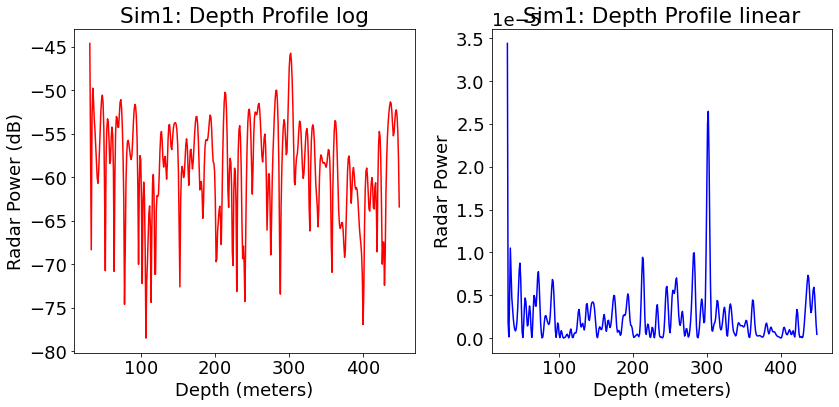

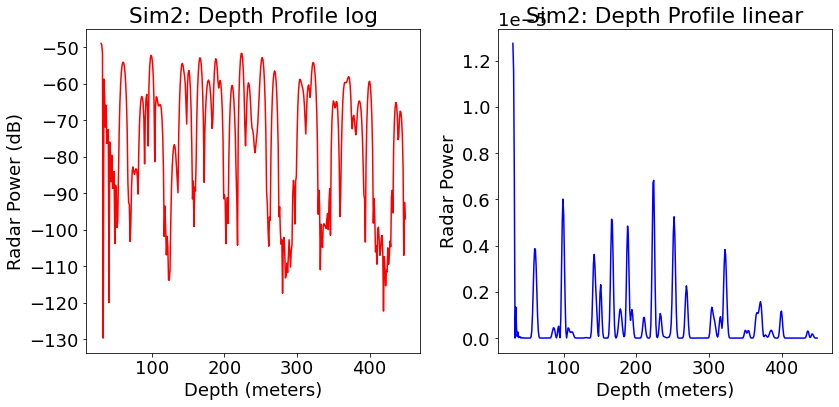

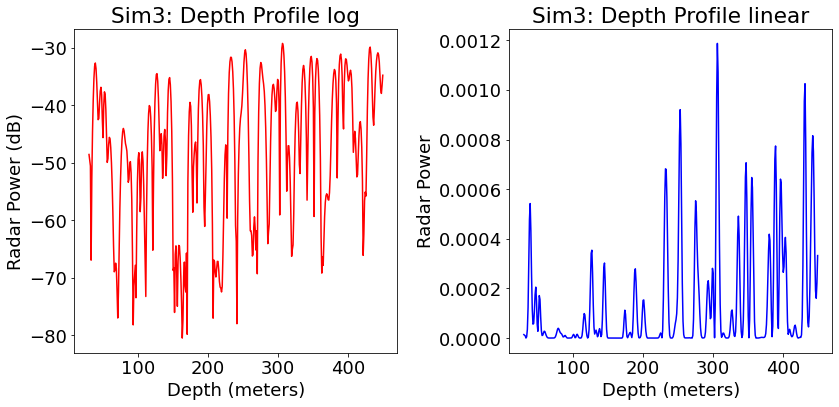

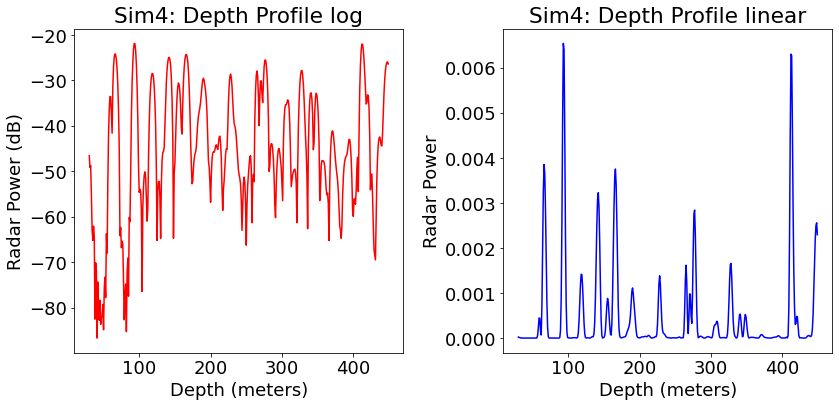

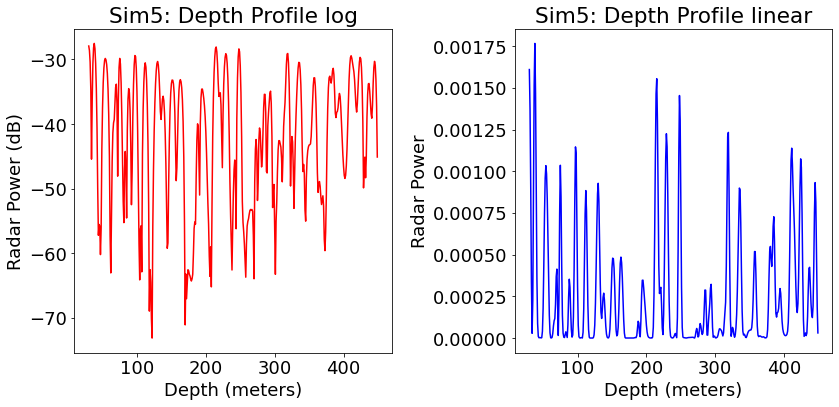

...

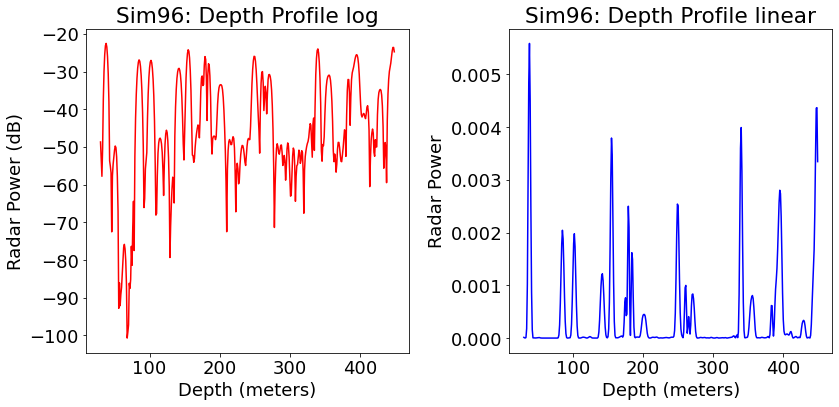

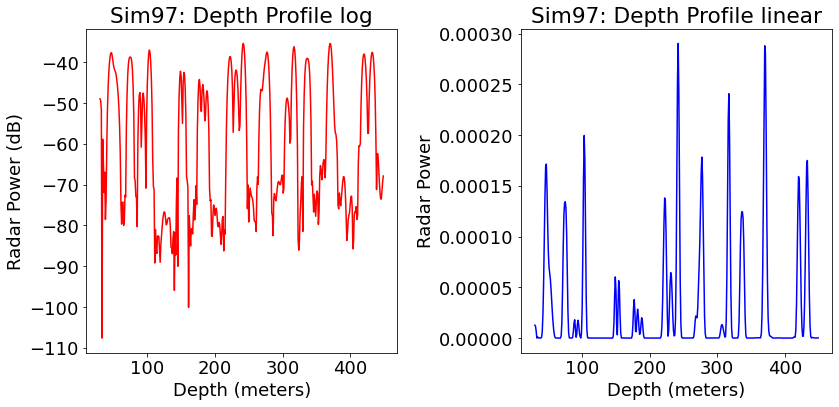

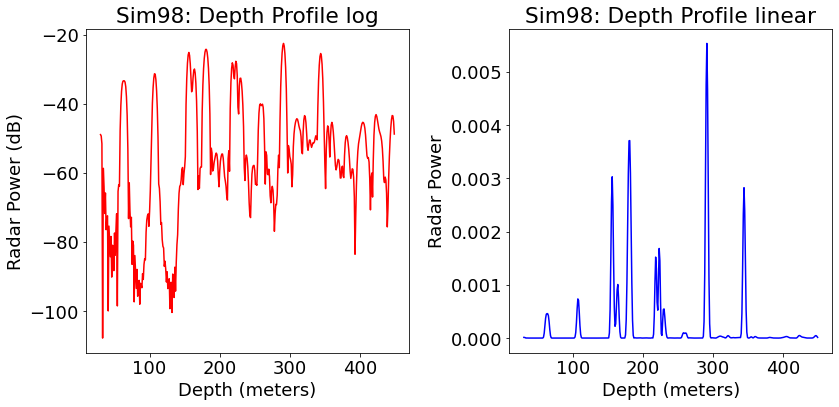

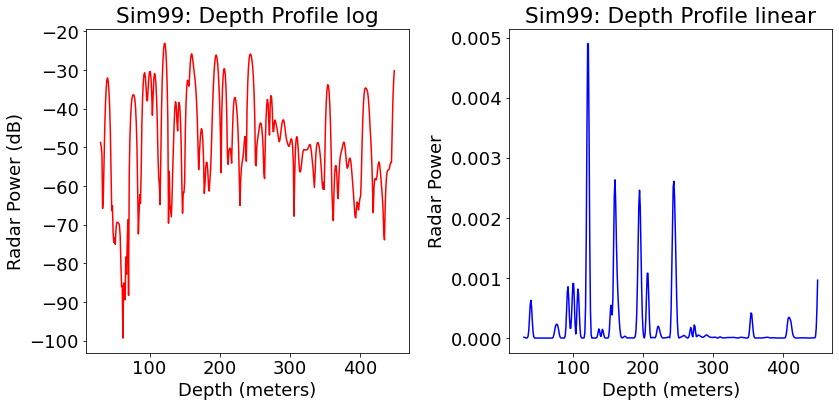

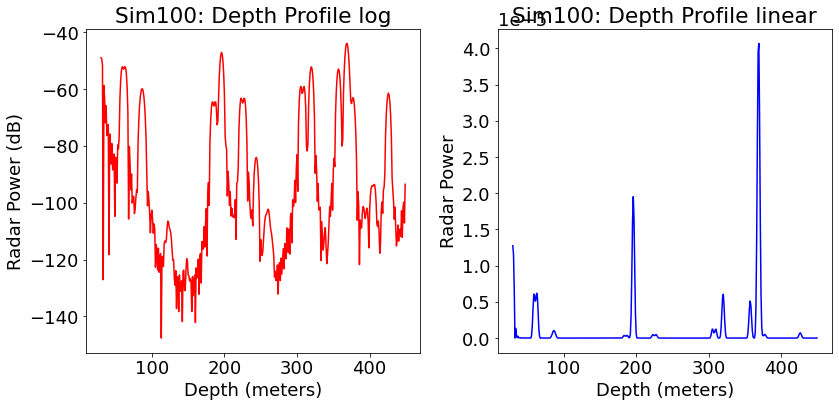

In [3]:
# print linearize plots
for i in column_names: 
    sample_strat = i
    x = df["Depth_px"].to_list()
    y = df[i].to_list()
    
    x_lin = df_lin["Depth_px"].to_list()
    y_lin = df_lin[i].to_list()
    
    peak = y.index(max(y[0:50])) #finds surface return
    surf = x[peak] #location of surface return
    
    x = x[peak+5:450] # remove surface and weird end peak
    y = y[peak+5:450] # remove surface and weird end peak
    
    peak_lin = y_lin.index(max(y_lin[0:50])) #finds surface return
    surf_lin = x_lin[peak_lin] #location of surface return
    
    x_lin = x_lin[peak_lin+5:450] # remove surface and weird end peak
    y_lin = y_lin[peak_lin+5:450] # remove surface and weird end peak
    
     #convert pixels to meters
    #x = p2m_waterice(x)
    #x_lin = p2m_waterice(x_lin)  
    
    
    plt.rcParams.update({'font.size': 18})
    #plot depth plot
    plt.figure(figsize = (12, 6))
    plt1 = plt.subplot(121)
    plt1.plot(x, y, 'r')
    #plt1.plot(x, fit, color = 'b') 
    plt1.set_title("Sim"+i+": Depth Profile log")
    plt1.set_ylabel('Radar Power (dB)')
    plt1.set_xlabel('Depth (meters)')

    #plot linearized spectra
    plt2 = plt.subplot(122)
    plt2.plot(x_lin, y_lin, 'b')
    plt2.set_title("Sim"+i+": Depth Profile linear")
    plt2.set_ylabel('Radar Power')
    plt2.set_xlabel('Depth (meters)')
    

    plt.tight_layout()
    plt.show()
    



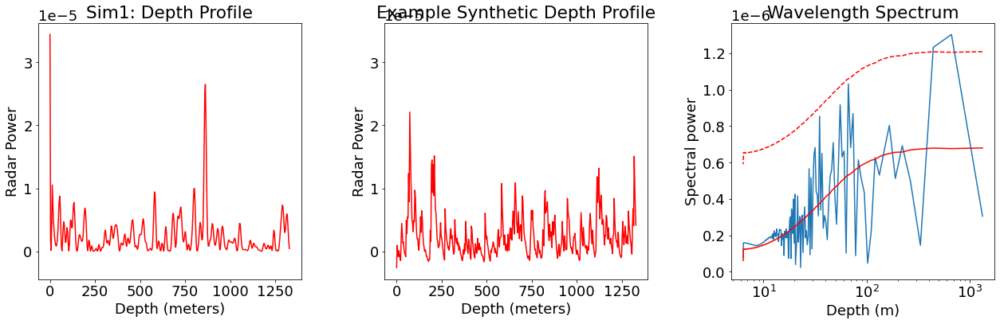

663.9743113604719 1.3031347033463065e-06
442.64954090698126 1.2324365879465935e-06


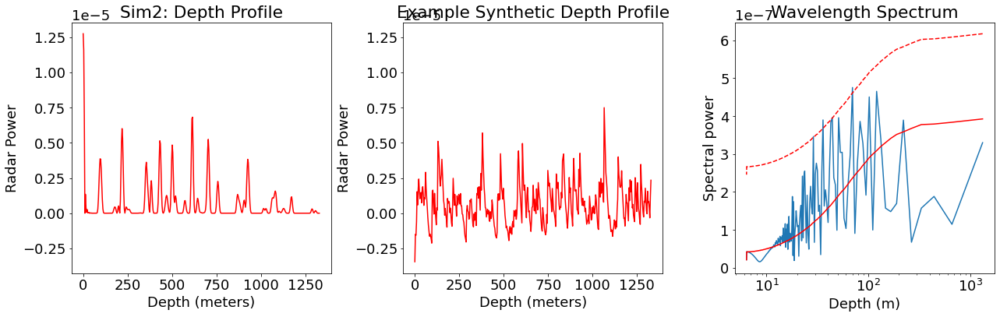

69.89203277478651 4.7538373109955966e-07
44.264954090698126 3.959253637921421e-07
35.89050331678227 3.898034485742716e-07
28.868448320020516 3.4597118361498475e-07


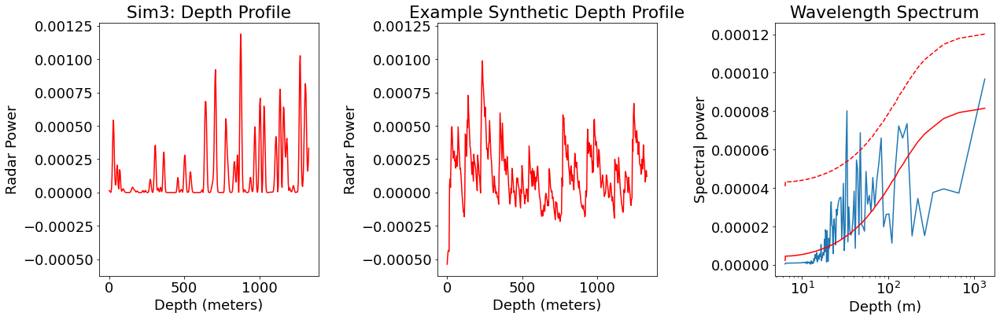

47.426736525748 6.878624495971706e-05
33.198715568023594 8.02153735490281e-05
32.3889907980718 5.81685739360233e-05


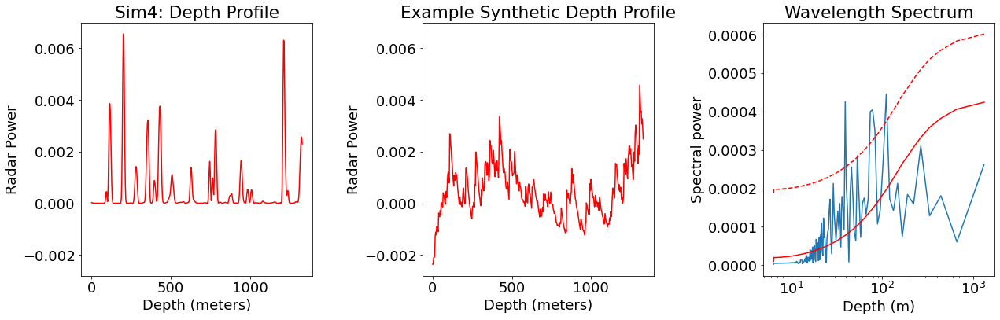

110.66238522674531 0.00044483931472996305
82.99678892005899 0.0003496605302508513
78.11462486593787 0.0004050059822224
73.77492348449688 0.00039969794373724636
53.11794490883776 0.0002848952392577203
39.057312432968935 0.00042524690341775754


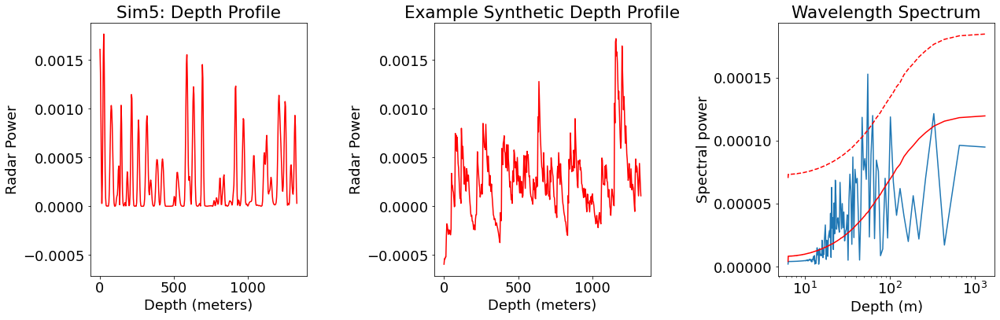

63.23564870099733 0.00011993600377258264
55.33119261337266 0.00015281346350231508
47.426736525748 0.00011851609818896289


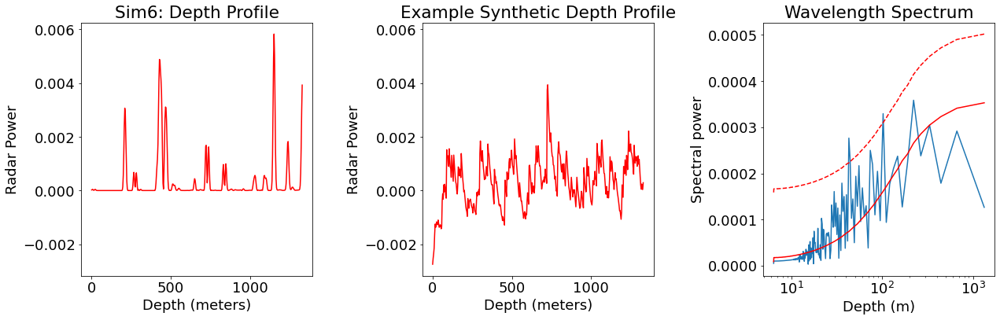

102.14989405545721 0.00032945719328510327
44.264954090698126 0.00022728473292805686
42.8370523458369 0.00027645135307706974


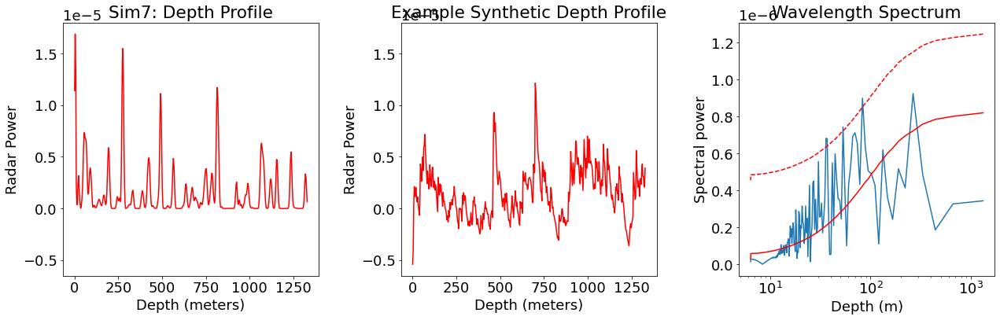

82.99678892005899 8.990814615582806e-07
53.11794490883776 7.433336056616e-07
36.88746174224844 6.797336061339523e-07
35.89050331678227 6.818033537648995e-07


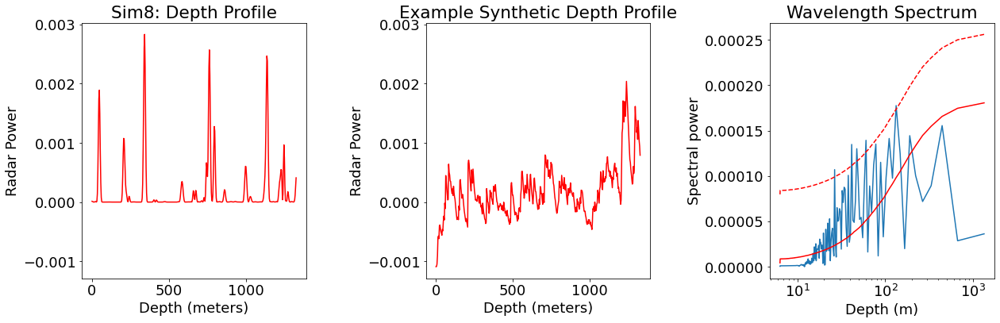

132.79486227209438 0.0001775467618809319
60.36130103277018 0.00013927441502406063
47.426736525748 0.00013001292488307794
41.498394460029495 0.00013473001235006813
26.55897245441888 0.00010699627339541818


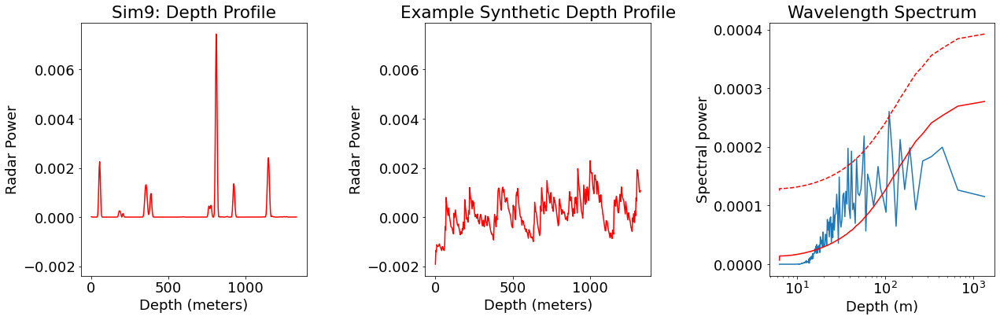

110.66238522674531 0.0002603466185454263
57.73689664004103 0.00021858189350746338
41.498394460029495 0.00019278439458131374
37.941389220598396 0.00019765688949539237


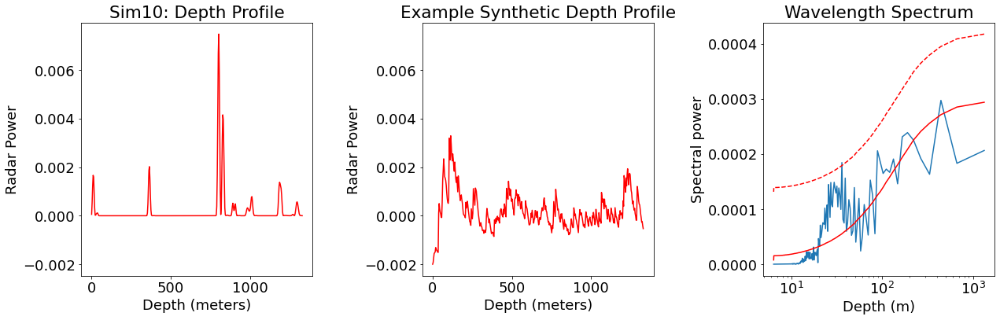

35.89050331678227 0.00018458432797411359


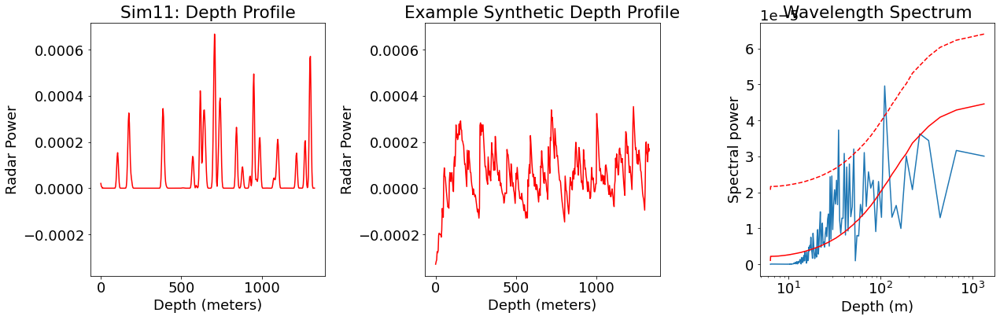

110.66238522674531 4.956998221325948e-05
51.074947027728605 3.205102194269032e-05
40.240867355180114 3.0824761448637624e-05
34.94601638739326 3.732535518446023e-05


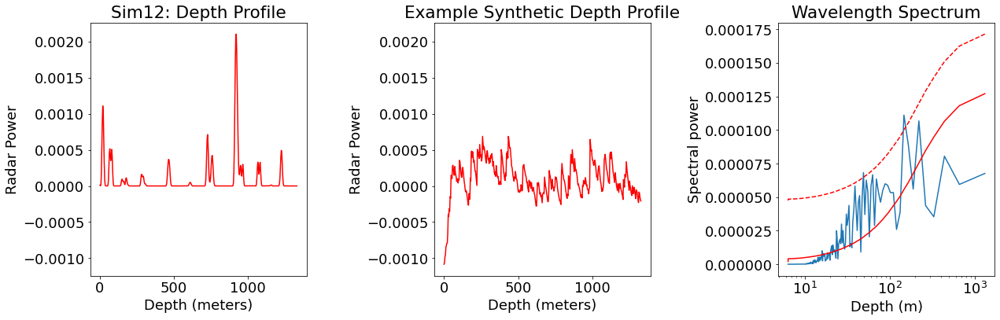

147.54984696899376 0.00011102720193124628
49.18328232299791 6.825675196811949e-05


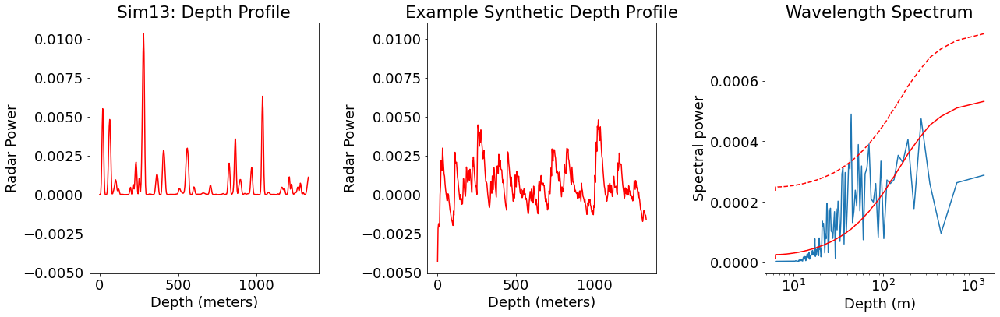

53.11794490883776 0.00038949982988251814
44.264954090698126 0.0004901696057646792


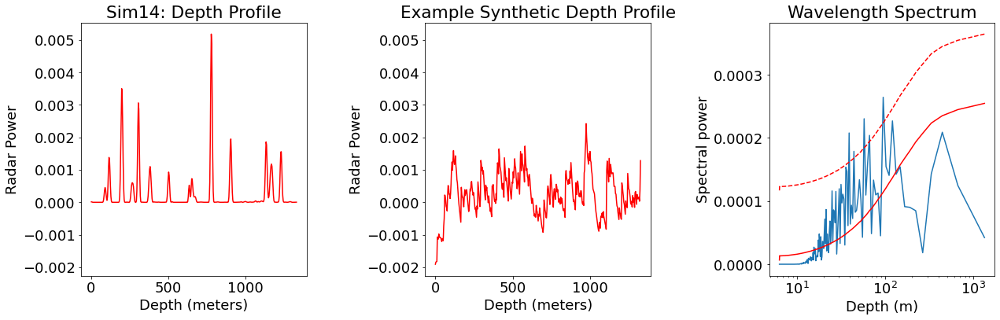

94.853473051496 0.0002643055608865266
66.39743113604719 0.00020396885613962275
57.73689664004103 0.0002302828054180453
44.264954090698126 0.00017868852062804104
39.057312432968935 0.0002077676527328493


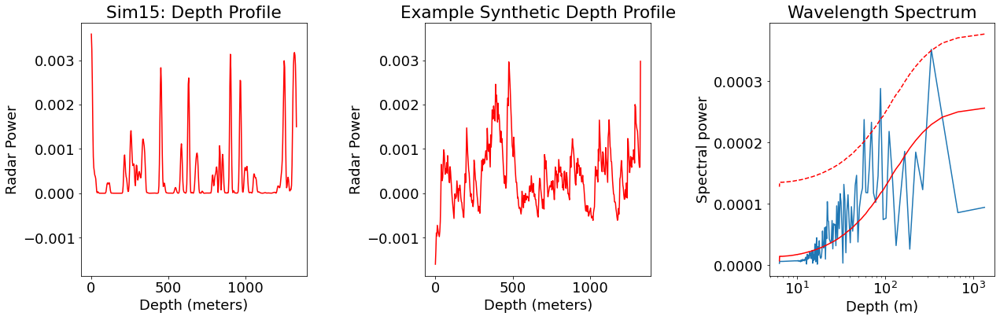

331.98715568023596 0.0003518348532745079
88.52990818139625 0.00028803407497731554
69.89203277478651 0.00023293901023659333
57.73689664004103 0.00023742325575693663


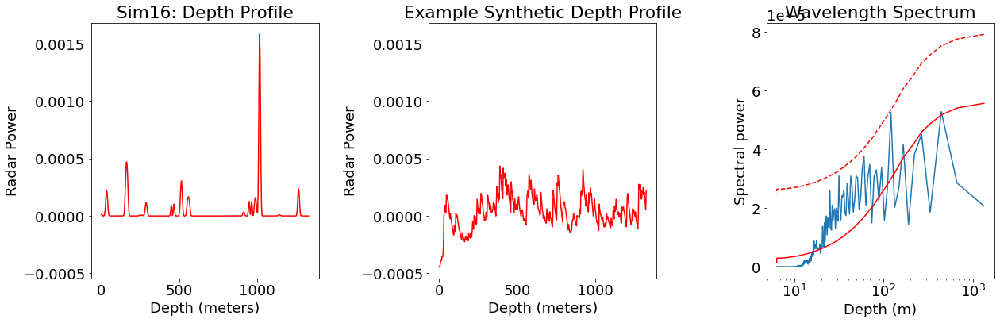

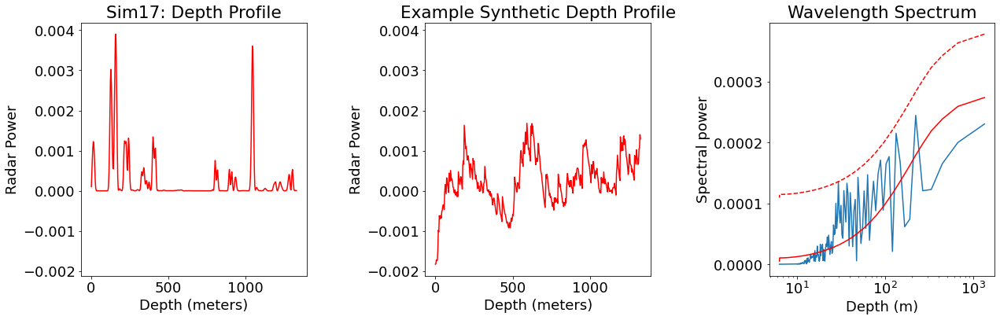

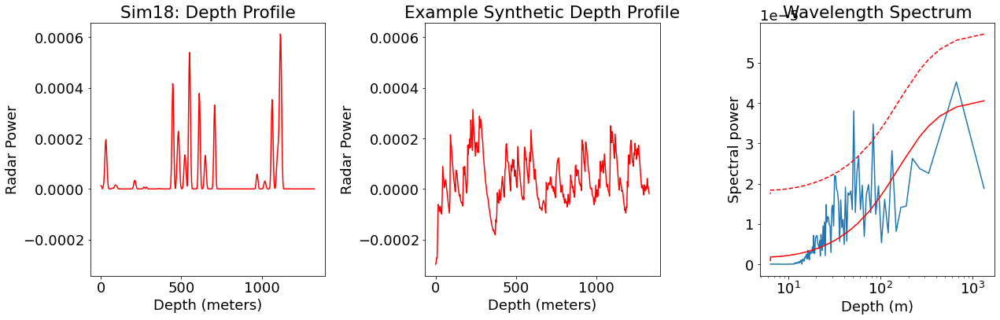

82.99678892005899 3.4755611866869944e-05
51.074947027728605 3.8074602334856697e-05


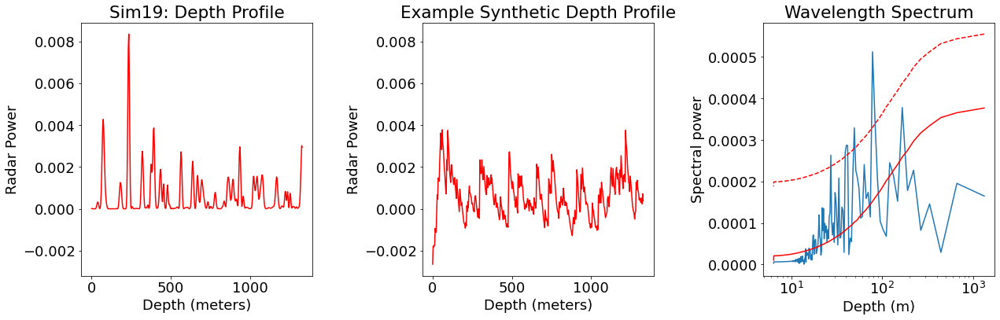

82.99678892005899 0.00034971016758411475
78.11462486593787 0.0005124629102674753
49.18328232299791 0.0003291361707483988
41.498394460029495 0.0002866965184908942
40.240867355180114 0.0002874723147802754
39.057312432968935 0.0002708595765307509
27.100992300427425 0.00026339442539189203


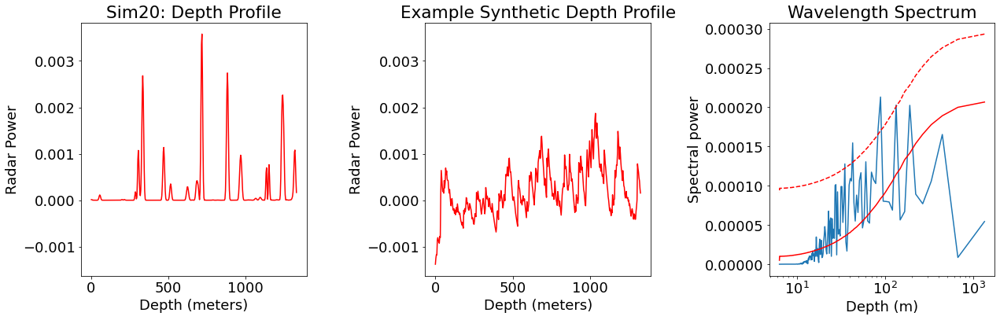

132.79486227209438 0.000202773539414223
88.52990818139625 0.00021308260928792872
82.99678892005899 0.00017155466328619938
42.8370523458369 0.00015462464128602357
34.94601638739326 0.00012782535233736887


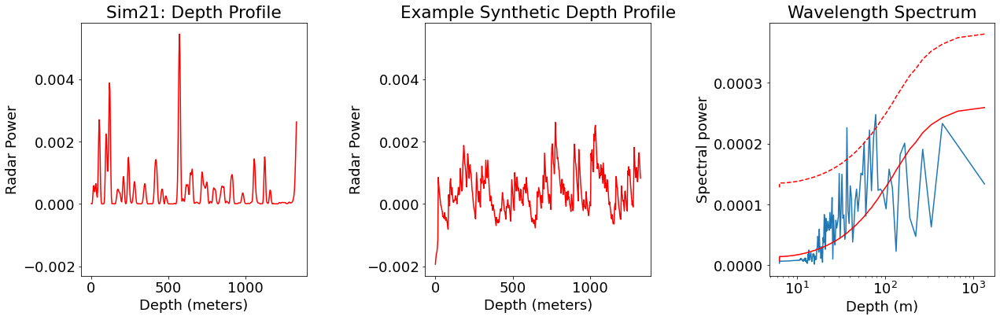

78.11462486593787 0.00024794845462169056
66.39743113604719 0.00022256492168987234
57.73689664004103 0.00020253068734420163
36.88746174224844 0.00022620663277474746


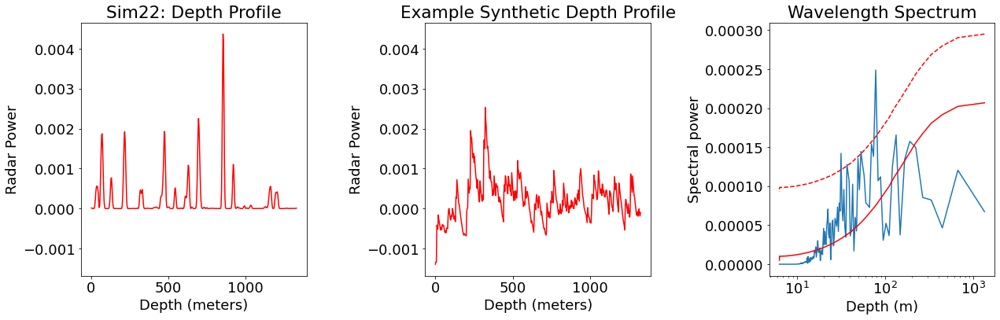

78.11462486593787 0.00024895819201394275
53.11794490883776 0.00014469471020550032
36.88746174224844 0.00012794578718026053
31.617824350498665 0.00014218720100802454


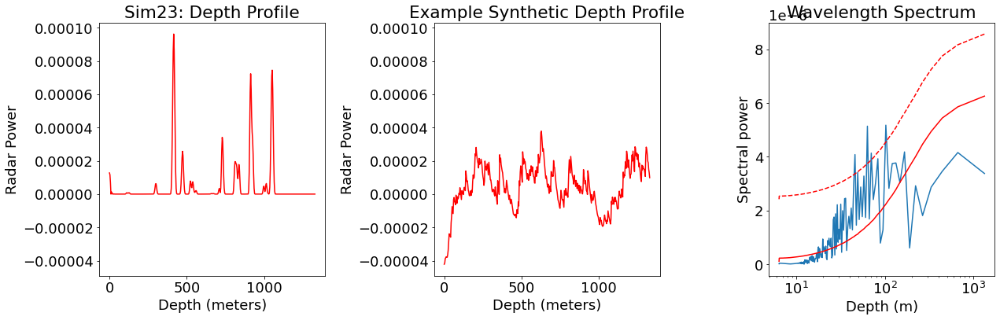

102.14989405545721 5.178390102501527e-06
69.89203277478651 4.139639183839533e-06
63.23564870099733 5.141777258331556e-06
45.791331817963574 4.084021330287599e-06


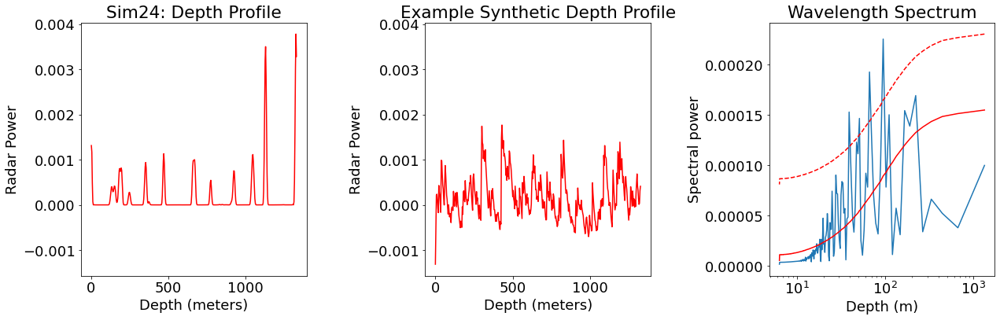

94.853473051496 0.00022552855182408156
66.39743113604719 0.0001928171511481809
51.074947027728605 0.00014671882477486096
39.057312432968935 0.00015302091063002705


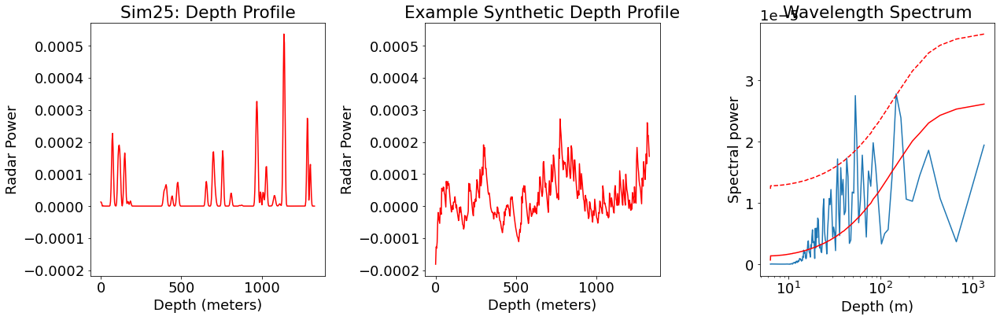

147.54984696899376 2.782571995750429e-05
55.33119261337266 1.9150772400055707e-05
53.11794490883776 2.752792978817369e-05
42.8370523458369 1.734280567398714e-05
34.0499646851524 1.7198836590695736e-05


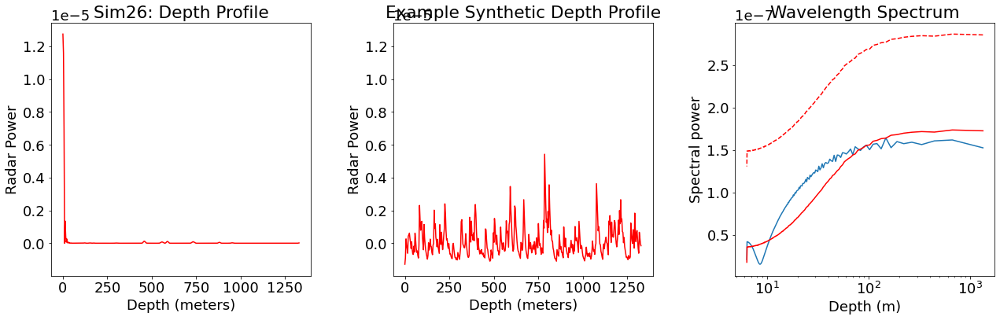

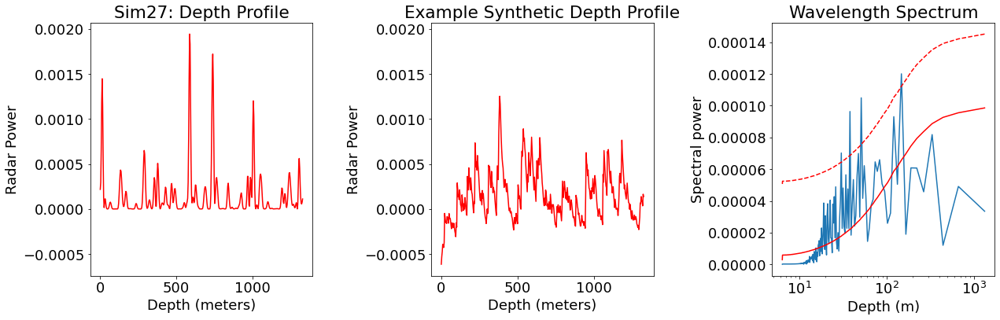

147.54984696899376 0.00012009662255644046
51.074947027728605 0.00010497110257467935
37.941389220598396 9.636144231514745e-05
30.18065051638509 7.022110955428569e-05


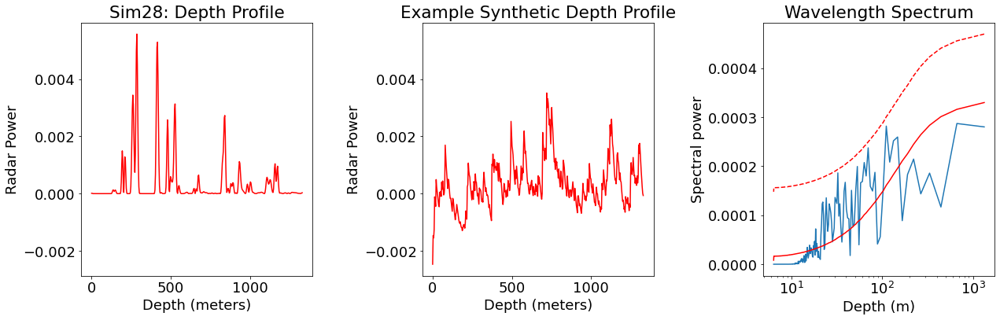

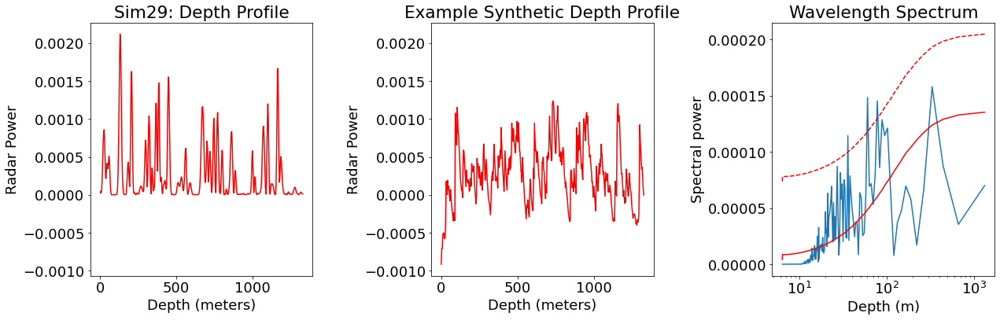

78.11462486593787 0.00014548784035058312
60.36130103277018 0.00014848005307055383
35.89050331678227 0.00011453134524606845


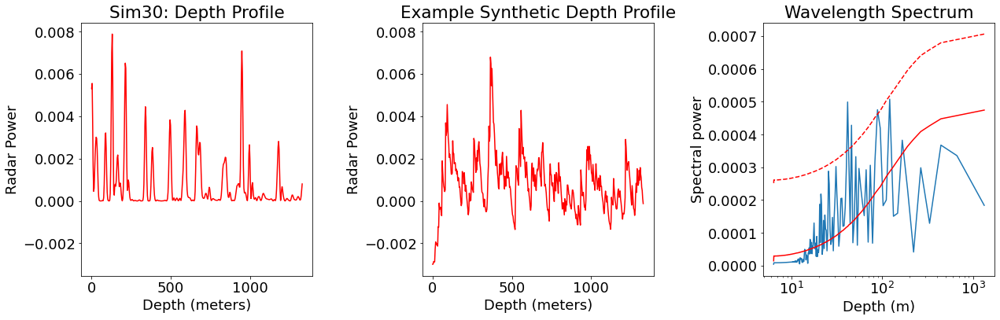

88.52990818139625 0.0004753552635244662
45.791331817963574 0.00042811084874232674
41.498394460029495 0.0004988626643884056


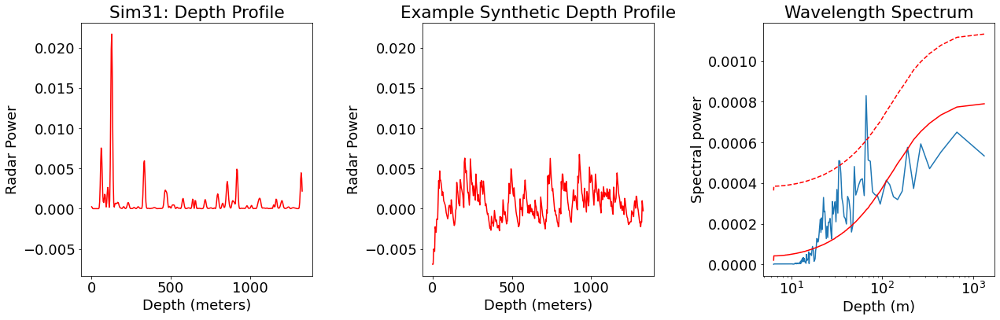

66.39743113604719 0.0008301154505120321
34.0499646851524 0.0005087392446891526
33.198715568023594 0.000510735626378047


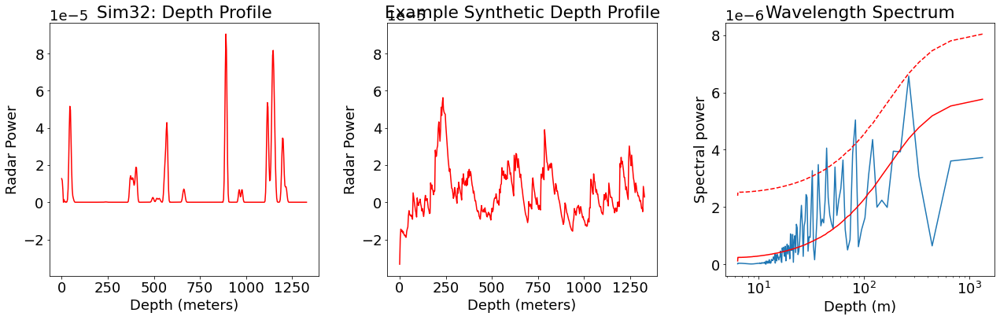

82.99678892005899 5.040835339265711e-06
44.264954090698126 4.0593576156370075e-06
36.88746174224844 3.482637006516674e-06
32.3889907980718 3.2723685219051977e-06


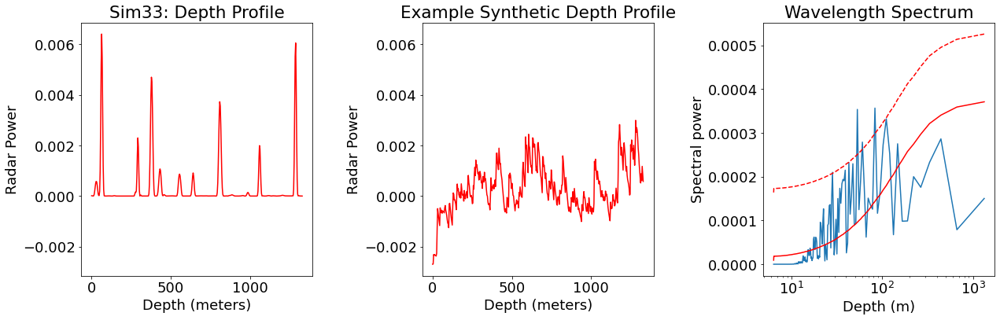

82.99678892005899 0.00035690613052865184
60.36130103277018 0.0002791558734888317
53.11794490883776 0.0003538939073113159
28.25422601533923 0.00021010640938100408


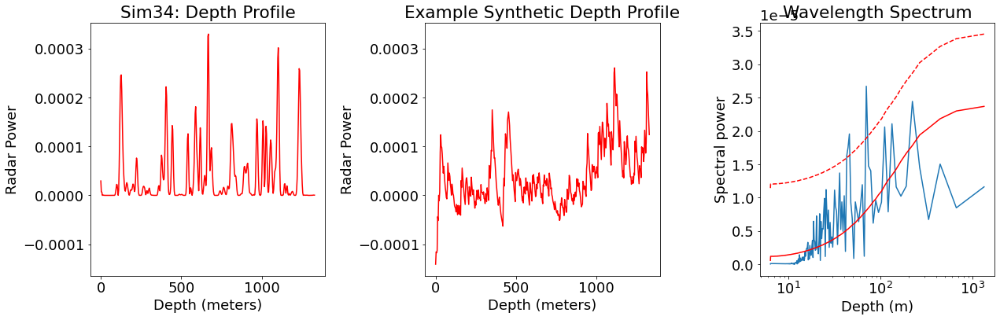

69.89203277478651 2.671397148950273e-05
45.791331817963574 1.9557759332882592e-05
44.264954090698126 1.7533274814864695e-05
42.8370523458369 1.6254043507342596e-05


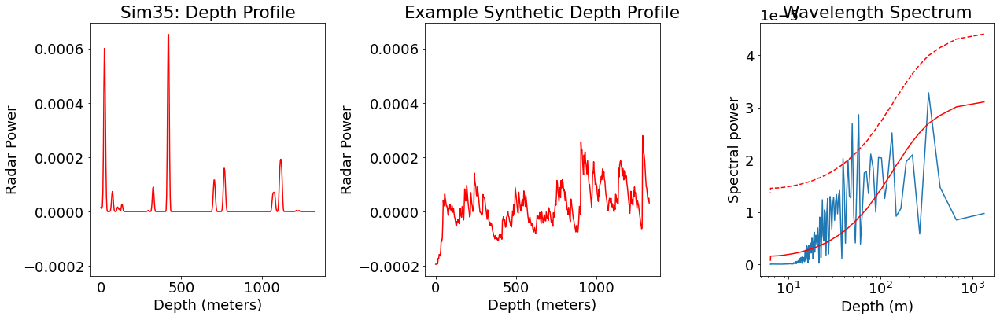

57.73689664004103 2.8612491107007698e-05
49.18328232299791 2.6861965263858158e-05
44.264954090698126 1.9932556157782217e-05
39.057312432968935 2.024657931054392e-05


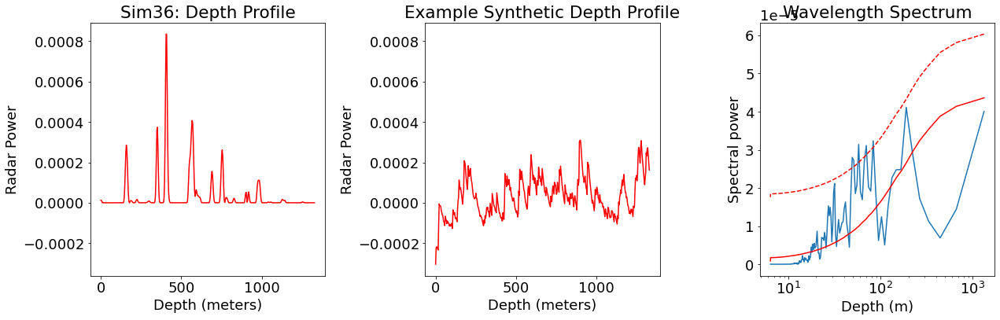

82.99678892005899 3.235712899338774e-05
69.89203277478651 3.113101102271237e-05
57.73689664004103 3.140286115991848e-05
51.074947027728605 2.722865878700135e-05
49.18328232299791 2.800588905362116e-05


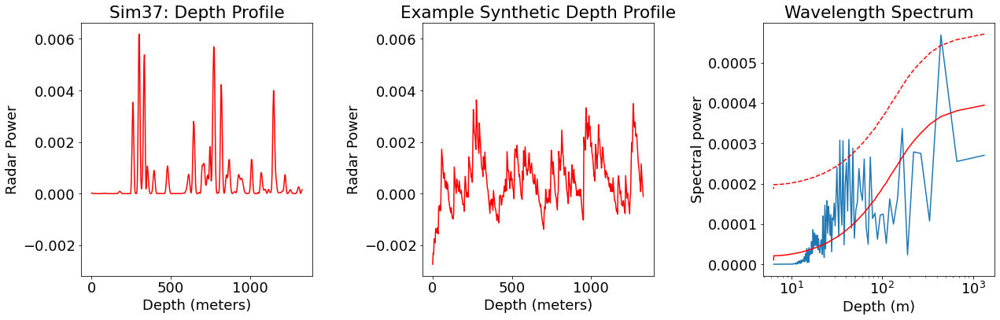

442.64954090698126 0.0005683849028331894
47.426736525748 0.0002879048821854457
42.8370523458369 0.0003096611815245445
36.88746174224844 0.0003063100689158445
34.0499646851524 0.0003078924828204721


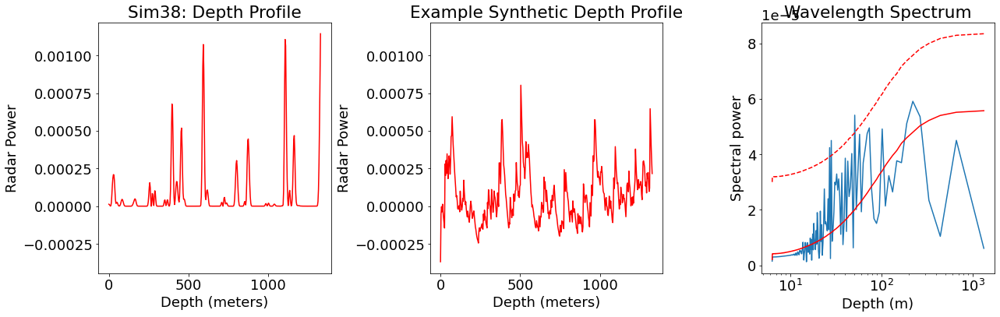

51.074947027728605 5.410623768419852e-05
28.25422601533923 4.49840183255598e-05
27.100992300427425 4.2404187549105494e-05


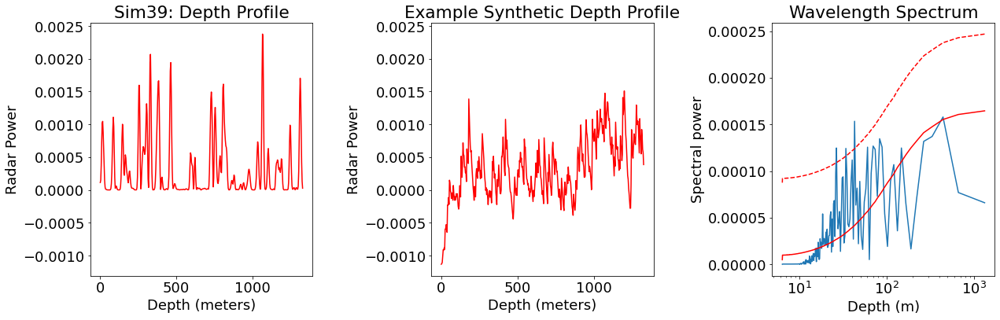

42.8370523458369 0.00015344695282634726
34.0499646851524 0.00012434611937664548
26.55897245441888 0.00012477732074482072


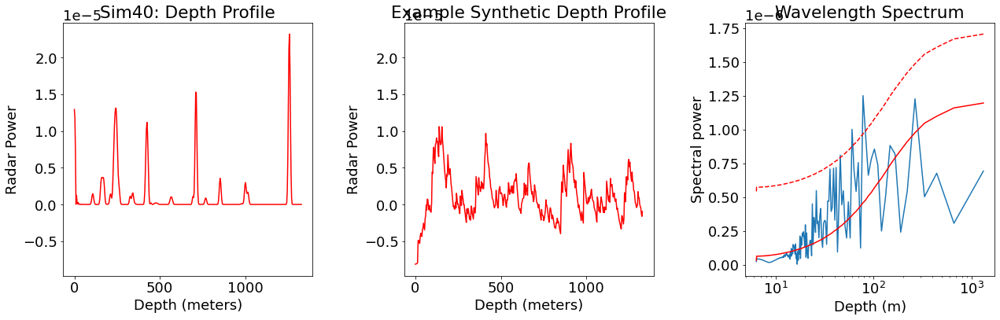

78.11462486593787 1.2497616878155796e-06
60.36130103277018 1.0001176481766303e-06
45.791331817963574 8.099854597343733e-07


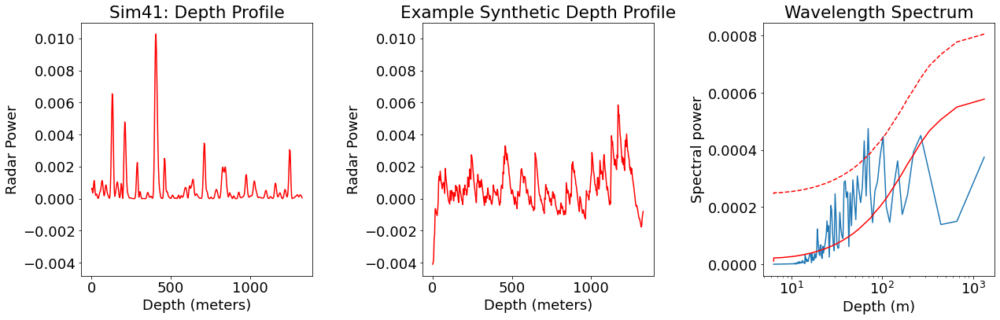

102.14989405545721 0.00044708053455519013
69.89203277478651 0.00047510266723819393
63.23564870099733 0.0004317009559595164


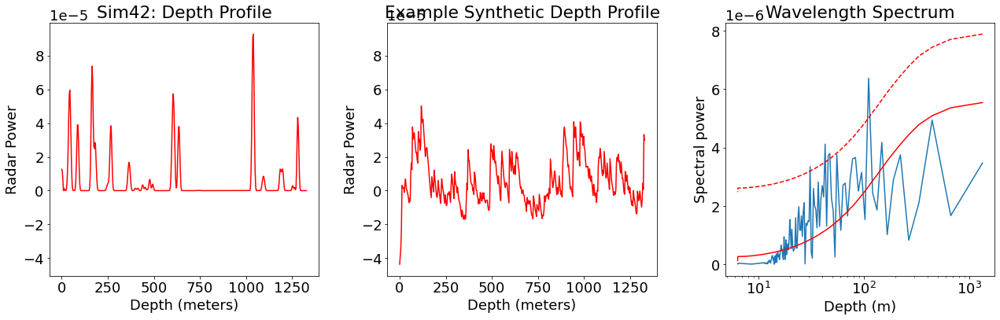

110.66238522674531 6.377071329525131e-06
47.426736525748 3.803312007598376e-06
45.791331817963574 3.7241029406630347e-06
42.8370523458369 4.1203033905831025e-06
30.88252610978939 3.352879052193801e-06


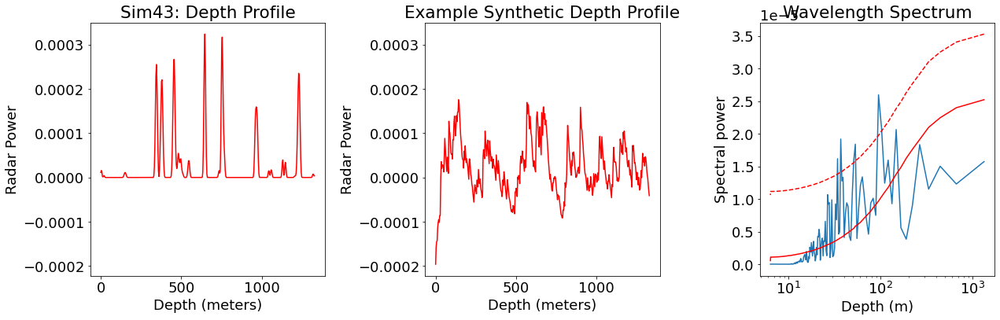

102.14989405545721 2.095845812631965e-05
94.853473051496 2.596080149216247e-05
53.11794490883776 1.8401220766941643e-05
51.074947027728605 1.591234563421905e-05
36.88746174224844 1.917712191732182e-05
34.0499646851524 1.6171026368914723e-05


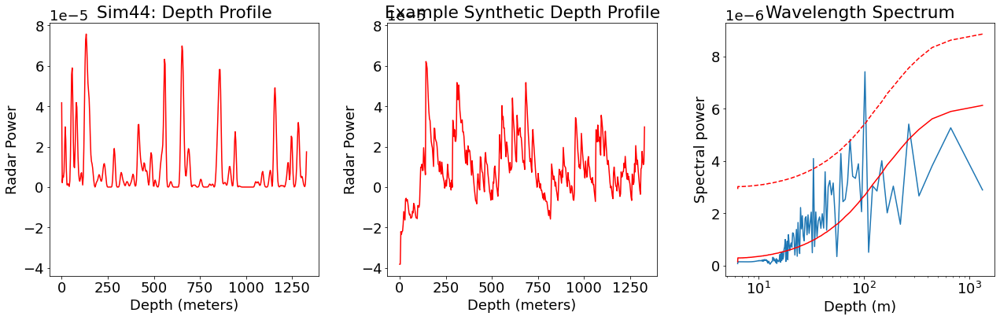

102.14989405545721 7.408967587666383e-06
73.77492348449688 4.821641405710635e-06
33.198715568023594 4.090259840470992e-06


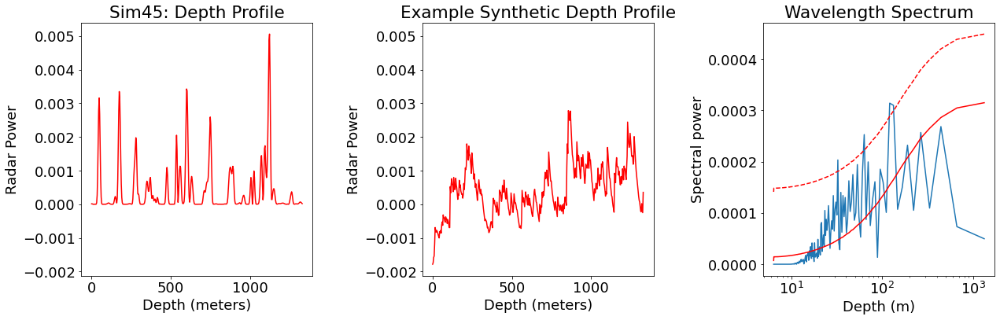

132.79486227209438 0.0003099681662534581
120.72260206554036 0.0003142427062973304
63.23564870099733 0.00025289794483448303
32.3889907980718 0.0002034418663978706


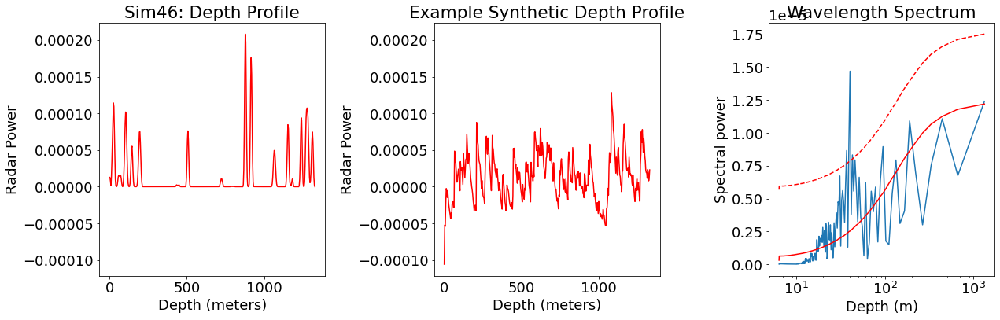

42.8370523458369 8.329710467580674e-06
40.240867355180114 1.4697628647136019e-05
39.057312432968935 9.141231050445115e-06
36.88746174224844 8.662590471333674e-06


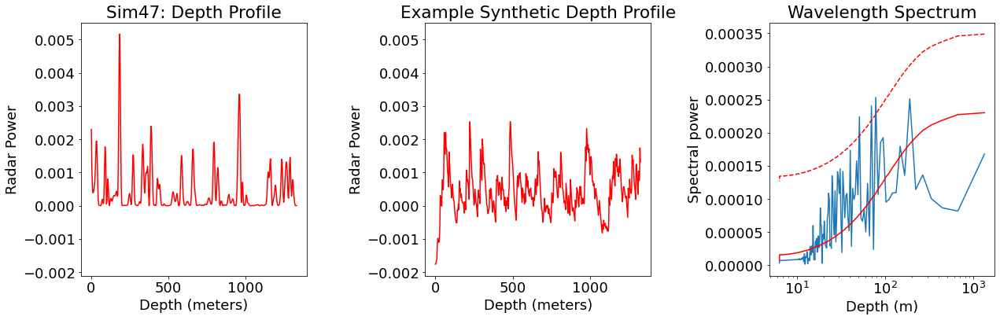

78.11462486593787 0.00025328110616658166
69.89203277478651 0.0002406752539484489
51.074947027728605 0.0002243760690677969


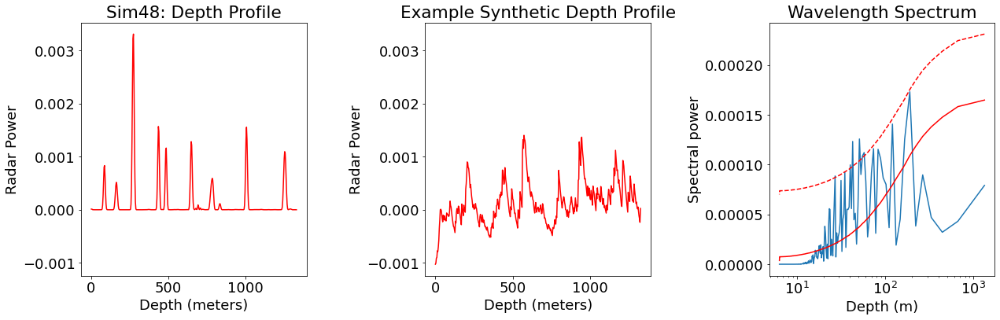

57.73689664004103 0.00011218508542391291
55.33119261337266 0.00010882523578896961
51.074947027728605 0.0001258287466076783
42.8370523458369 0.0001233501103470283
40.240867355180114 9.97939736630211e-05
27.100992300427425 8.866366514534793e-05


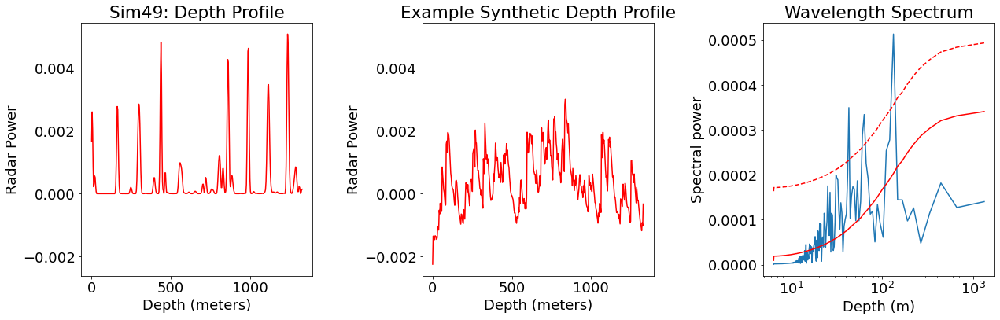

132.79486227209438 0.0005132870376385051
63.23564870099733 0.0003341599305859635
60.36130103277018 0.00028809622743890105
42.8370523458369 0.00034954527879212625


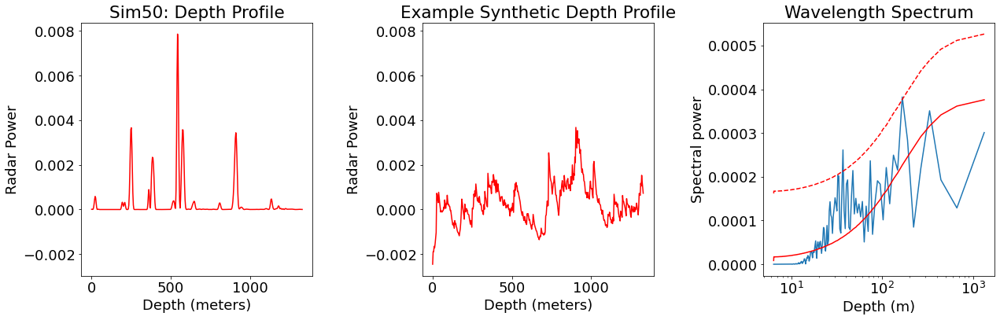

165.99357784011798 0.00038248849039544295
36.88746174224844 0.00026134545324772224


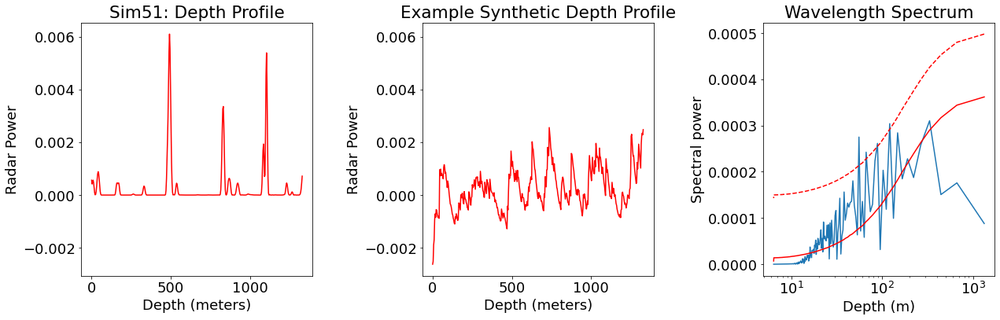

120.72260206554036 0.0003040834822144566
88.52990818139625 0.0002614023914407065
66.39743113604719 0.0002424144723981514
55.33119261337266 0.00027506959835236675


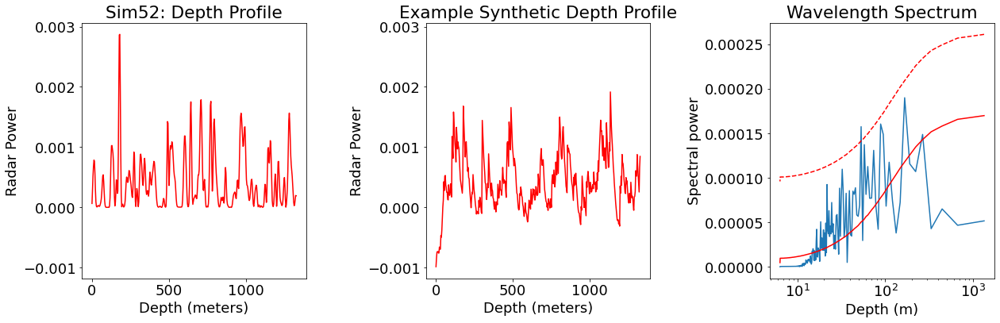

53.11794490883776 0.00015750270733880874


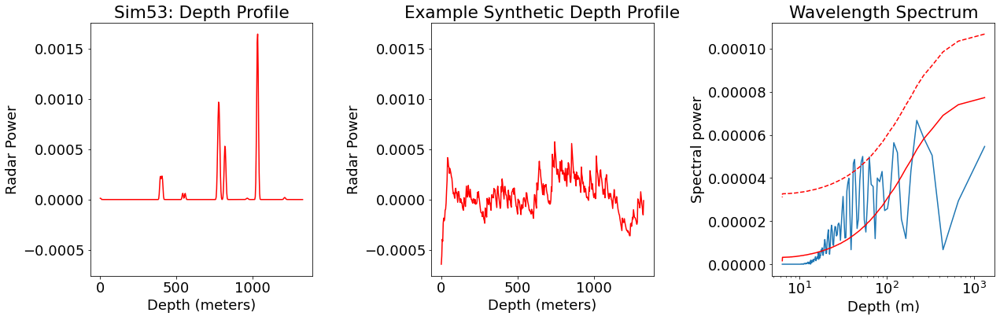

63.23564870099733 4.9761351312225404e-05
53.11794490883776 5.000454440763013e-05
51.074947027728605 4.744146475479419e-05
42.8370523458369 4.862386090467488e-05
41.498394460029495 4.678426990476886e-05


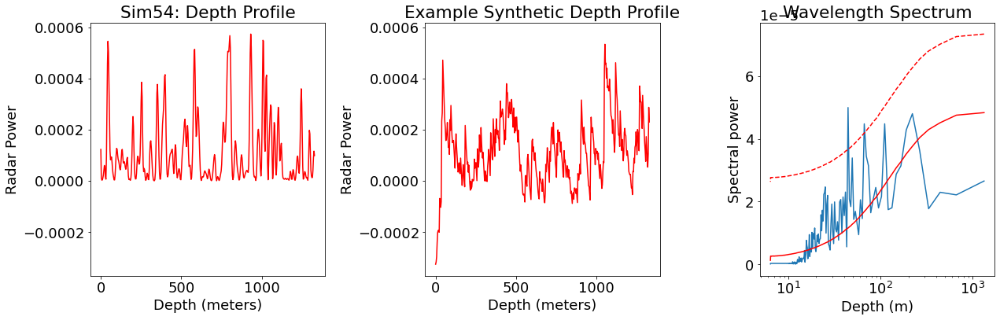

66.39743113604719 4.476256614775531e-05
44.264954090698126 4.99487090911251e-05


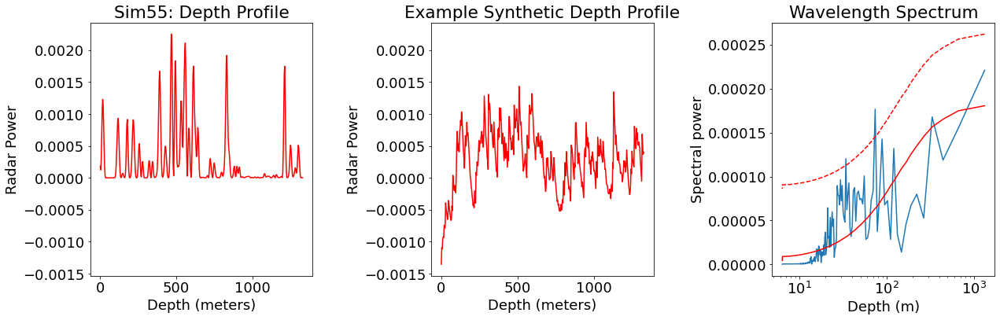

73.77492348449688 0.00017650107889903544
34.0499646851524 0.000120355067826741


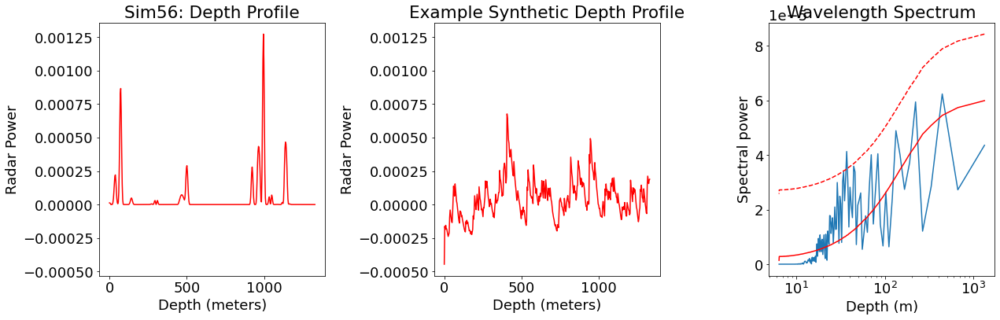

36.88746174224844 4.1268147456814695e-05


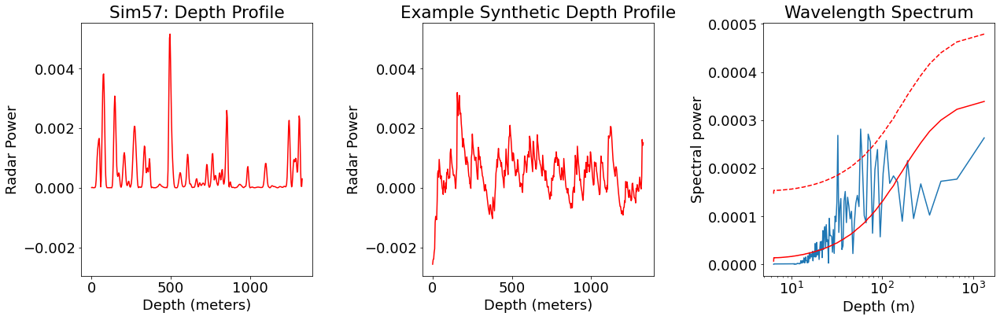

73.77492348449688 0.0002542086210208502
69.89203277478651 0.0002709103249871677
57.73689664004103 0.00028148512497807356
32.3889907980718 0.00026830539410368815


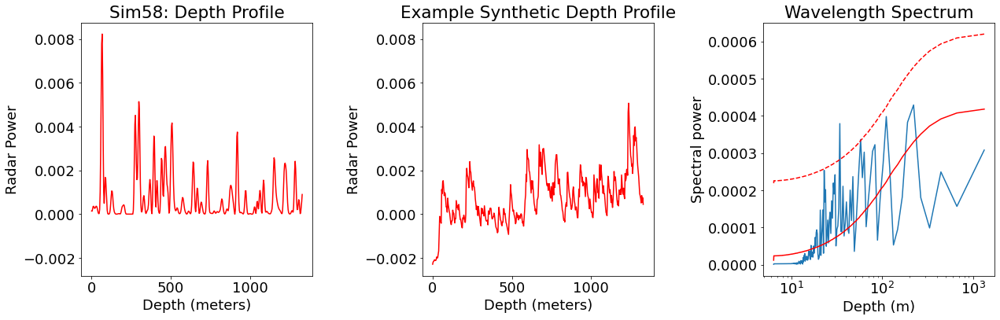

57.73689664004103 0.00033681394103685227
34.0499646851524 0.0003793707442420353


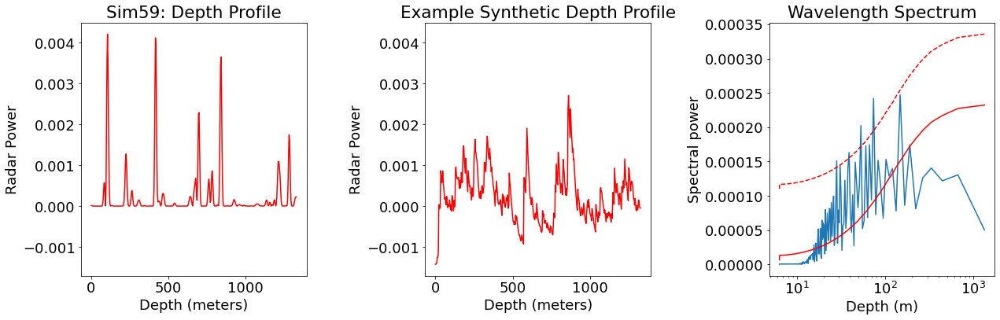

73.77492348449688 0.00024172035680918822
53.11794490883776 0.00020228496208508
39.057312432968935 0.00016315244073372275
28.25422601533923 0.00015101452591469603


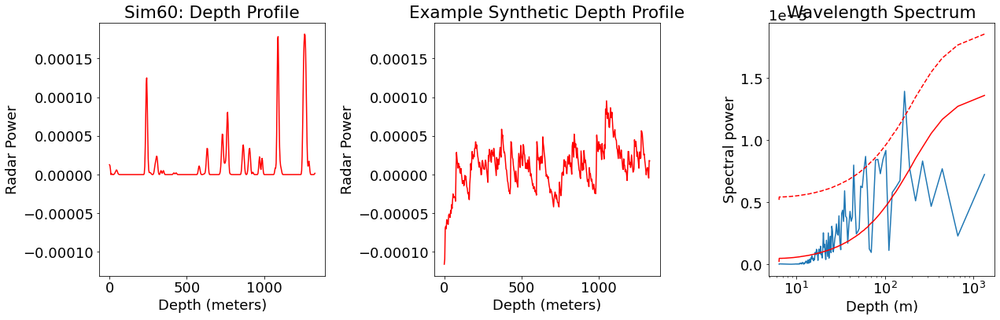

165.99357784011798 1.394743994714409e-05
60.36130103277018 8.698338257615816e-06
44.264954090698126 8.000349993893313e-06


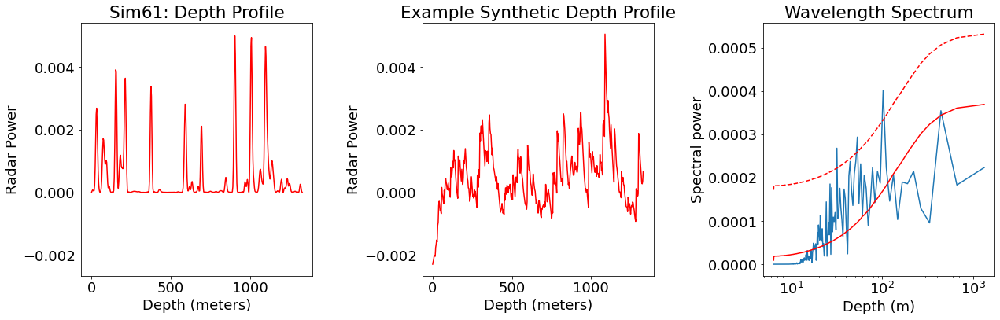

102.14989405545721 0.00040153000708506955
53.11794490883776 0.00029359476376454493
31.617824350498665 0.00026800073269147526


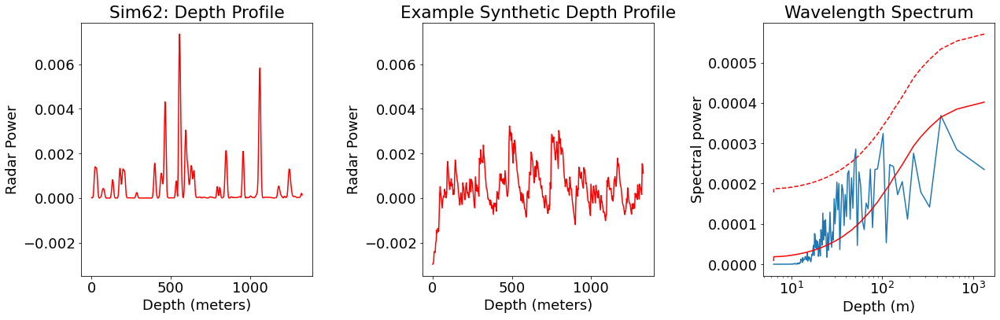

51.074947027728605 0.0002854264087130348


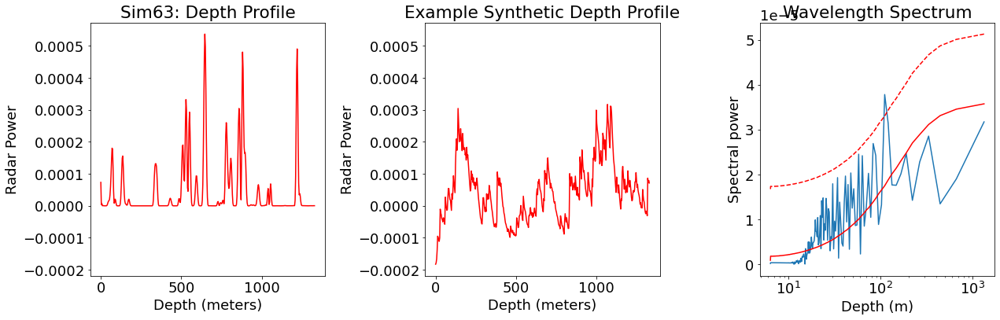

110.66238522674531 3.783290425804721e-05


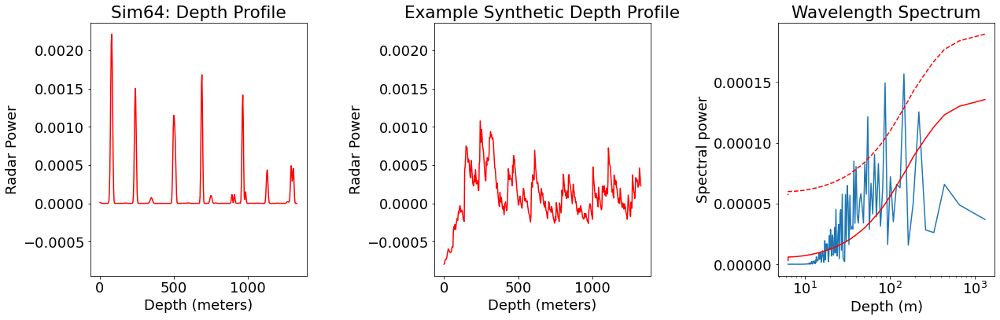

147.54984696899376 0.00015667520008780228
88.52990818139625 0.00014933802926930573
55.33119261337266 0.00012143903644824656
40.240867355180114 8.052172746602524e-05
37.941389220598396 8.484626943098134e-05


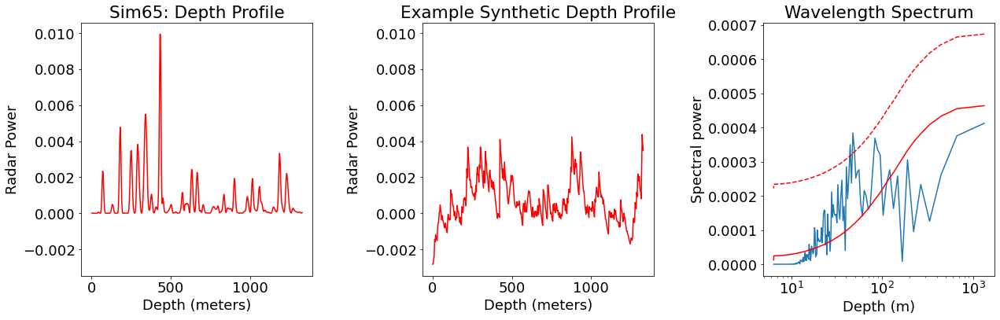

49.18328232299791 0.00033851022669930433
47.426736525748 0.0003840054625440606
44.264954090698126 0.0003495985502569079


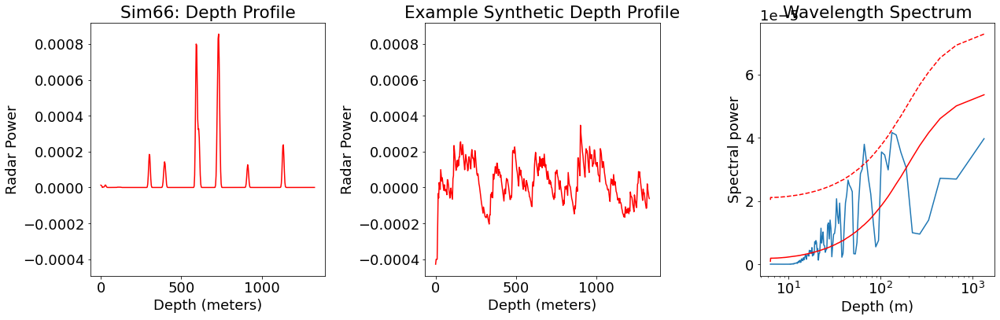

69.89203277478651 3.299896445758331e-05
66.39743113604719 3.7973857053764395e-05


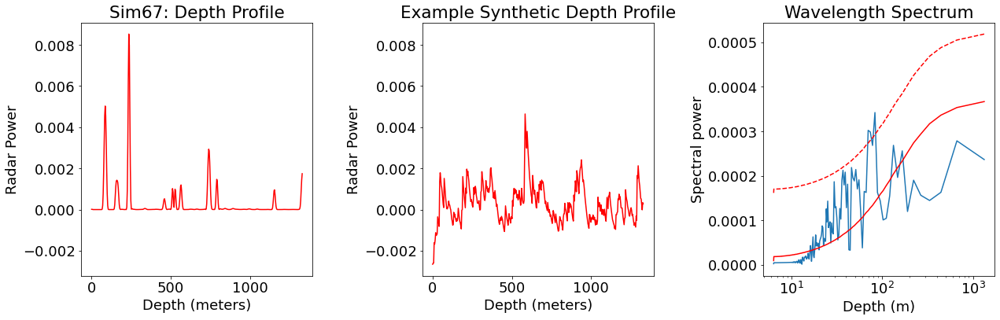

82.99678892005899 0.00034223617667366826
73.77492348449688 0.0002984816455282288
69.89203277478651 0.00030214915431777144


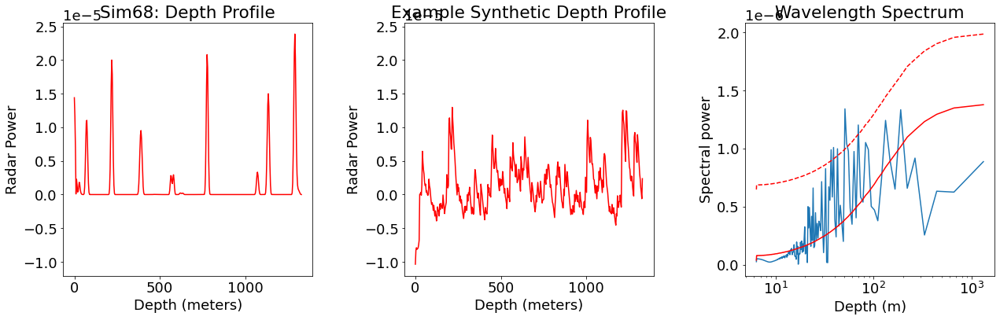

69.89203277478651 1.203178917703065e-06
53.11794490883776 1.0454074900666685e-06
51.074947027728605 1.3420744708875677e-06
42.8370523458369 9.981682841870073e-07
39.057312432968935 1.0093922834937733e-06
36.88746174224844 9.899751141936355e-07


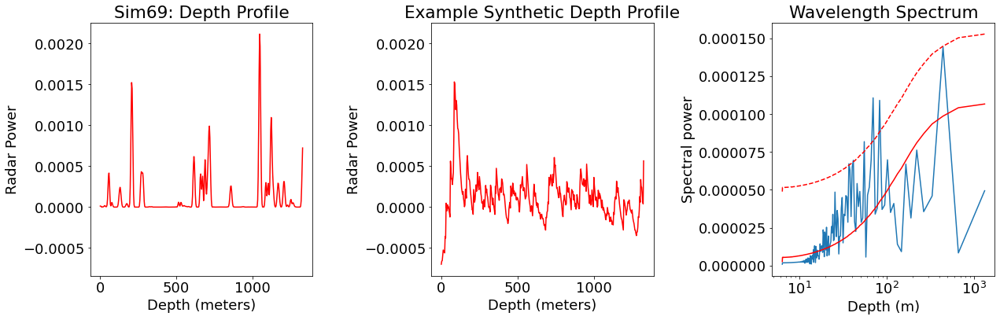

82.99678892005899 0.0001090436645276982
69.89203277478651 0.00011069181334406776
55.33119261337266 8.180680167388e-05
41.498394460029495 6.954444905198682e-05
36.88746174224844 6.721859951793312e-05


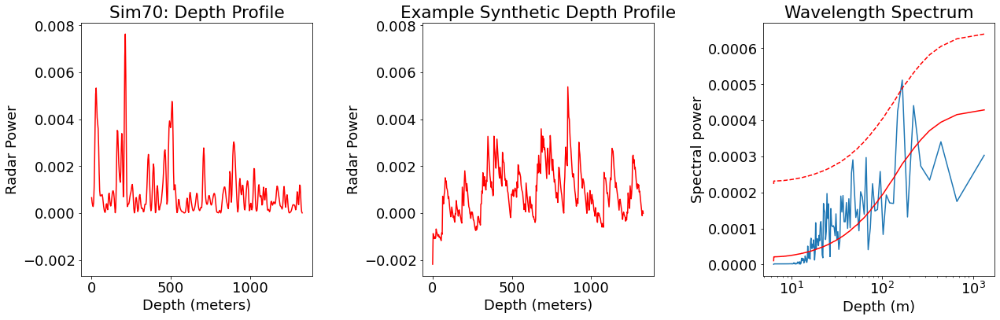

165.99357784011798 0.0005113218934538157


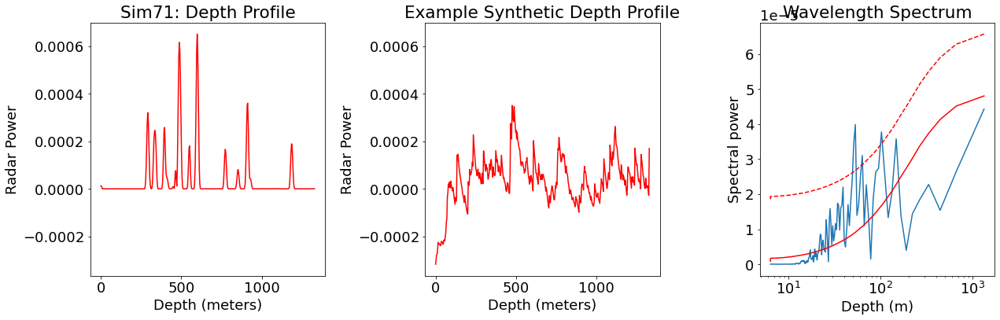

102.14989405545721 3.774364706288273e-05
63.23564870099733 3.102132023741573e-05
53.11794490883776 3.983689239623178e-05
51.074947027728605 3.4391828355408684e-05


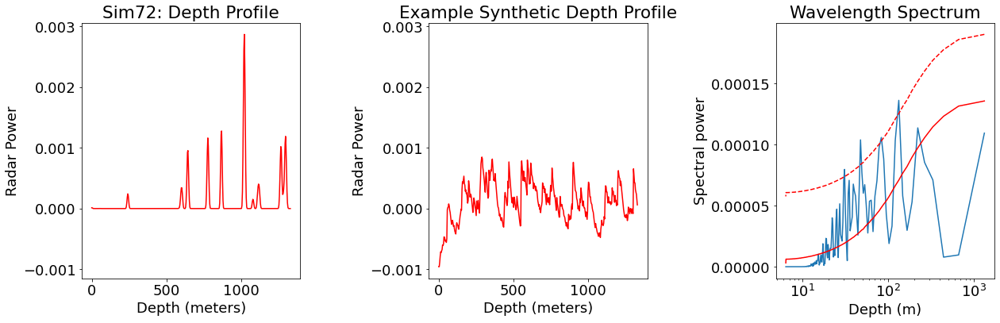

132.79486227209438 0.0001362091683770643
82.99678892005899 0.00010582634702662773
47.426736525748 0.0001038676194309406
30.88252610978939 7.967082008191464e-05


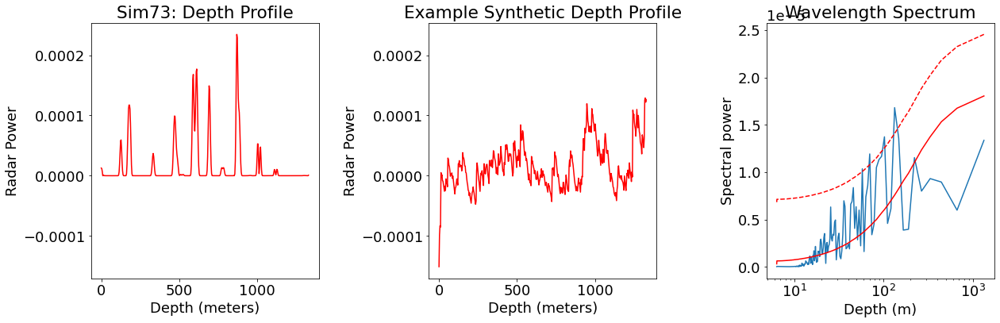

132.79486227209438 1.6811476209343205e-05
102.14989405545721 1.3729205720696639e-05
69.89203277478651 1.1920865478850192e-05
57.73689664004103 1.0349398944584841e-05


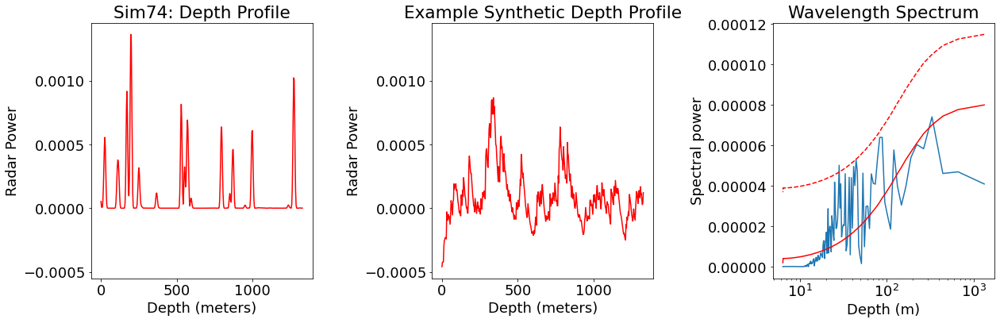

28.25422601533923 5.0183630564683195e-05


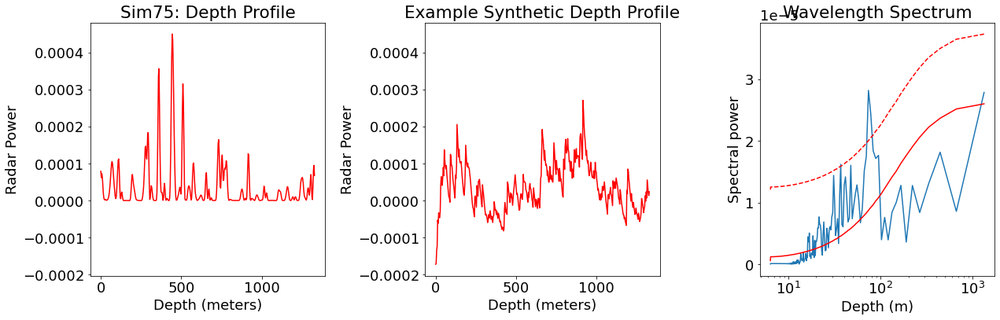

78.11462486593787 2.438984009934143e-05
73.77492348449688 2.8182517659014787e-05
36.88746174224844 1.6216562762795815e-05


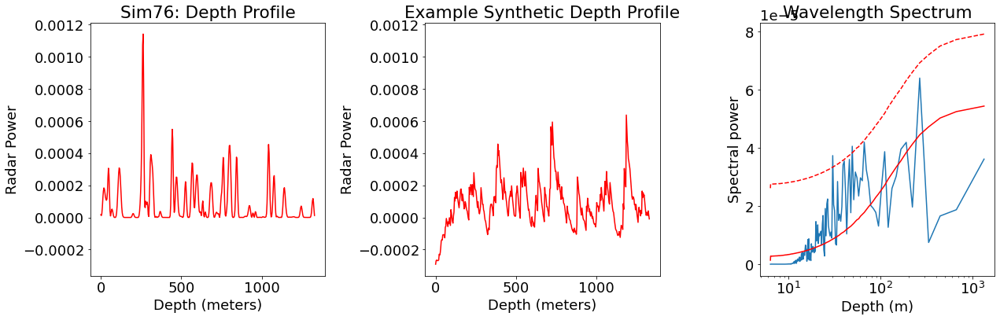

49.18328232299791 4.0598966364264793e-05
30.18065051638509 3.738871009296698e-05


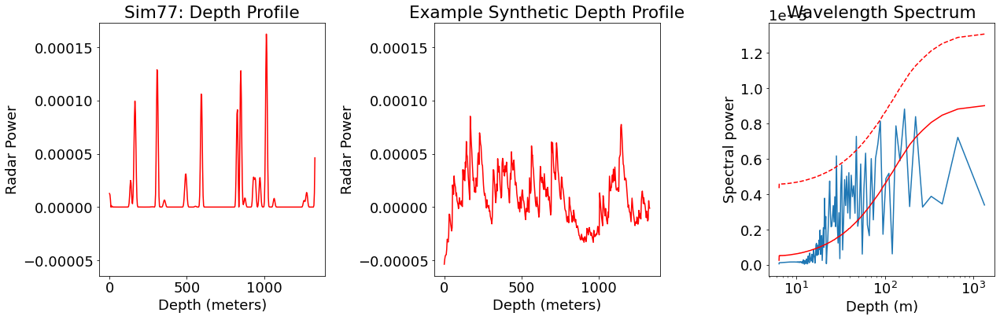

47.426736525748 7.278753740610673e-06
28.25422601533923 6.173278490350208e-06


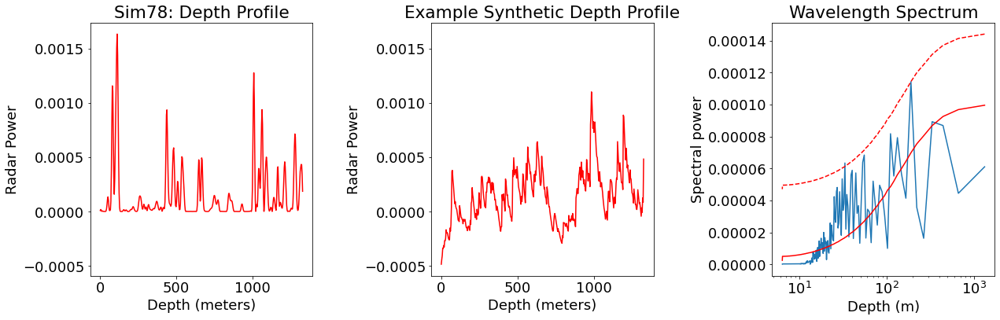

33.198715568023594 6.338214935708827e-05


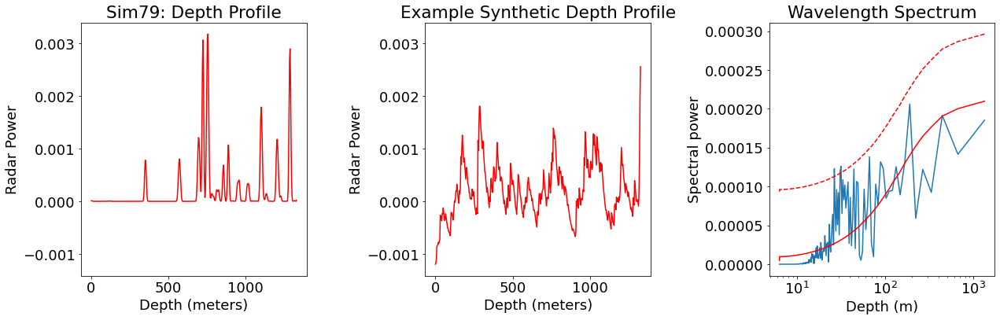

31.617824350498665 0.00012614653925495
30.88252610978939 0.00011984607342426792
26.55897245441888 0.0001230523587926691


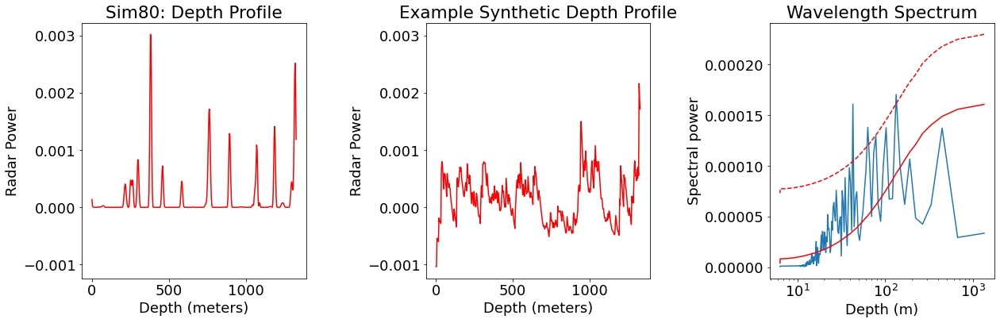

132.79486227209438 0.00017054722664329295
63.23564870099733 0.0001381436212337964
42.8370523458369 0.00016095013281209187


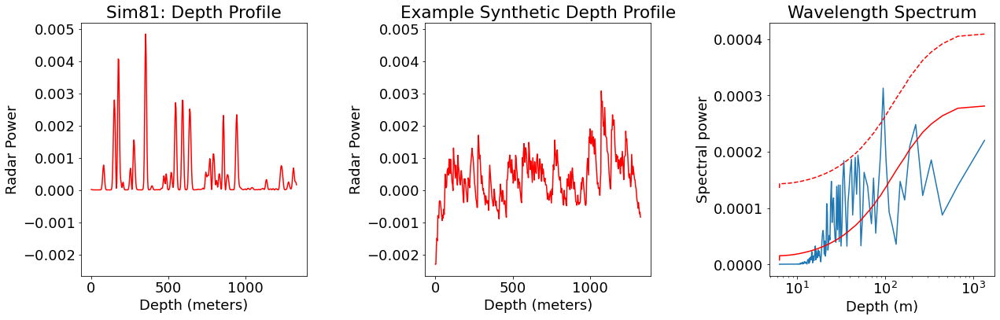

94.853473051496 0.000312957308710662
34.0499646851524 0.00018409146135720916


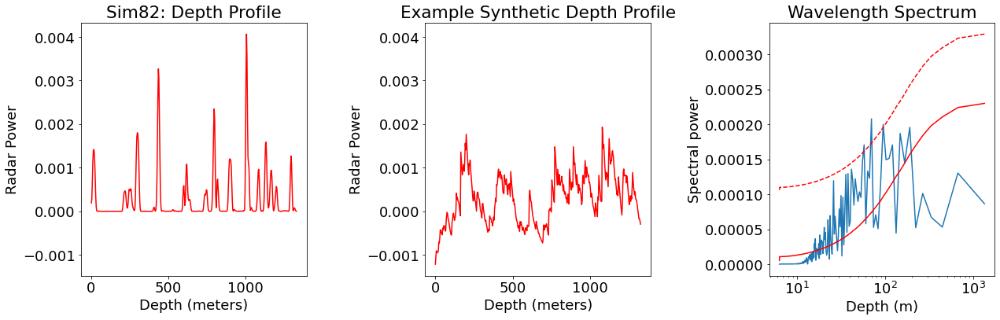

94.853473051496 0.00019990917671448827
69.89203277478651 0.0002080464582183786
57.73689664004103 0.00017081551125751007


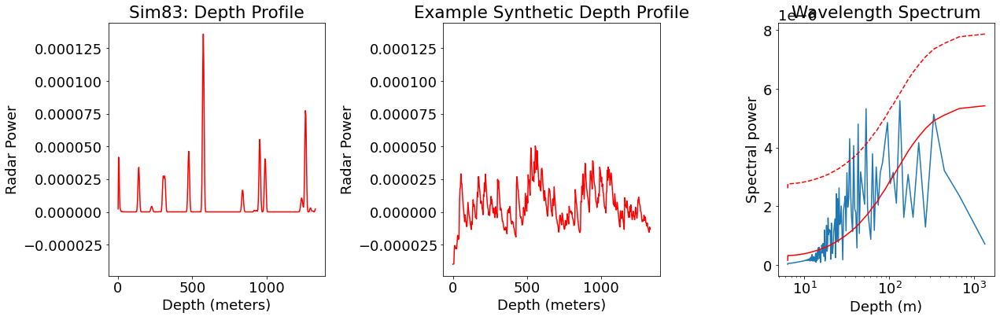

53.11794490883776 5.32483884131703e-06
42.8370523458369 4.803200160111553e-06
37.941389220598396 4.069999063973583e-06
34.0499646851524 4.303665510073563e-06


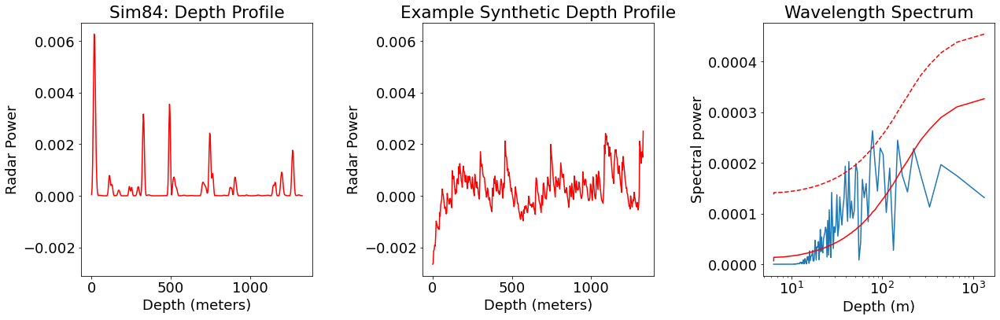

78.11462486593787 0.00026358065176620125
51.074947027728605 0.0001985618120924586
42.8370523458369 0.0002024470160486528
39.057312432968935 0.00019363564602501918


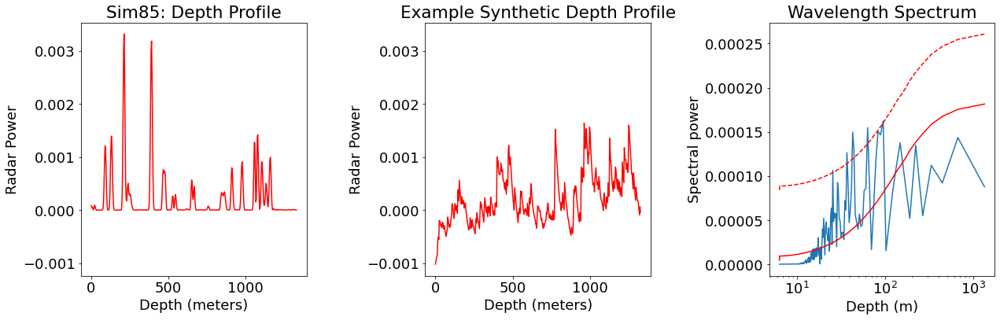

94.853473051496 0.00016220617690818604
63.23564870099733 0.00015481108469322217
44.264954090698126 0.00012898444723311755
42.8370523458369 0.00014979043059927188
36.88746174224844 0.00012650981764957518
25.537473513864303 0.00010656359927392053


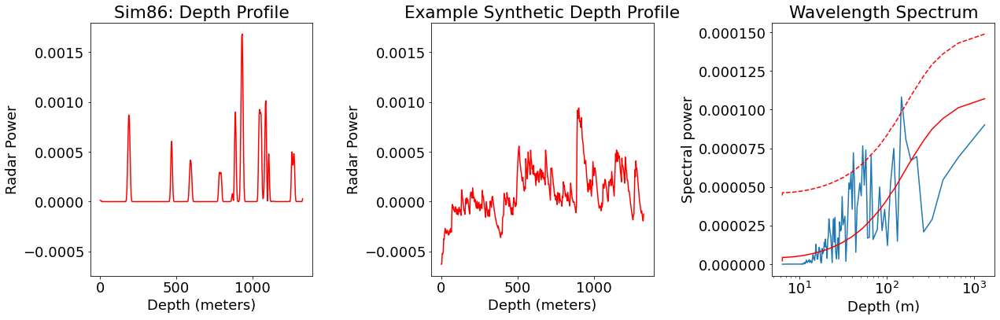

147.54984696899376 0.00010812875816224459
57.73689664004103 7.392398227201753e-05
53.11794490883776 7.660951855985751e-05
41.498394460029495 7.219450554252727e-05


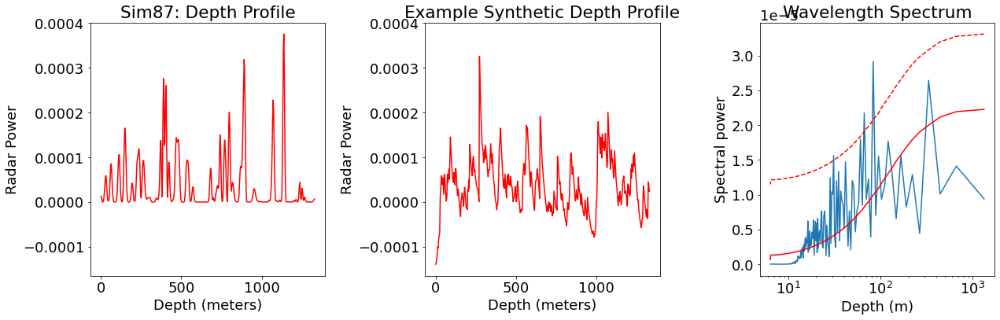

82.99678892005899 2.914060002992071e-05
66.39743113604719 2.172681349448791e-05
30.88252610978939 1.563754219476384e-05


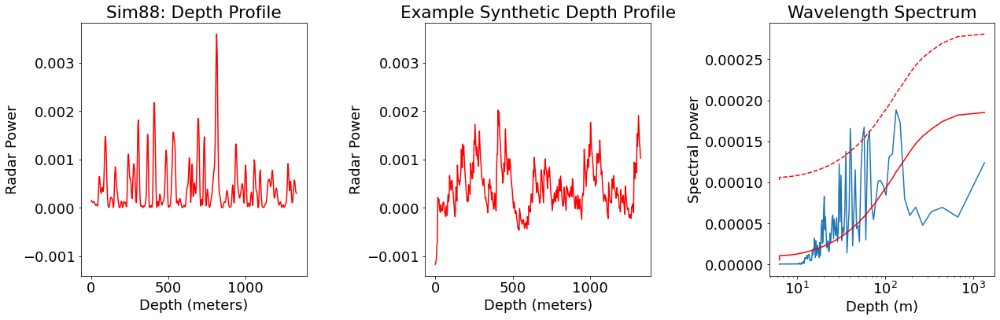

66.39743113604719 0.000162349860285756
57.73689664004103 0.00016725512260493914
55.33119261337266 0.00015353377485285616
40.240867355180114 0.00016573277414166156
35.89050331678227 0.00013774400846644746


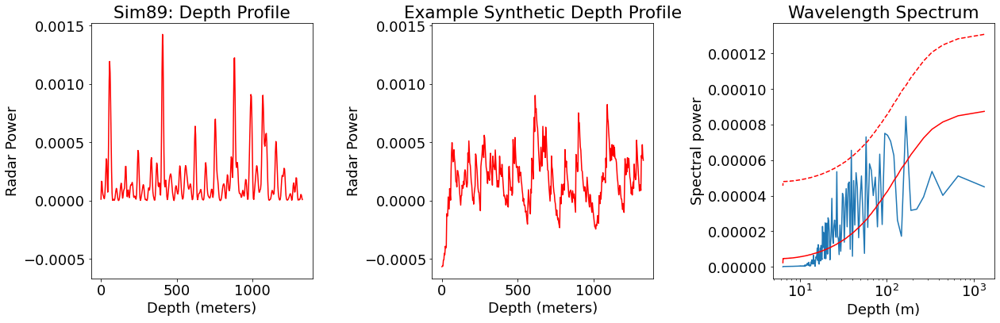

57.73689664004103 7.307536164753181e-05
39.057312432968935 6.552953206812815e-05


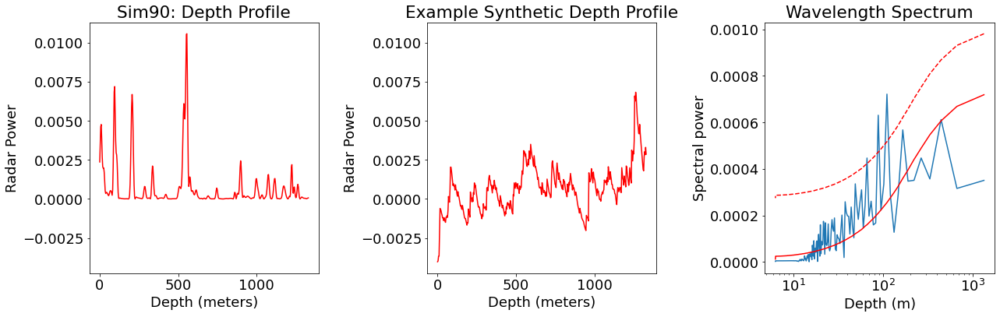

110.66238522674531 0.0007212566977971747
88.52990818139625 0.0006306726338266503
66.39743113604719 0.0004465955008455484


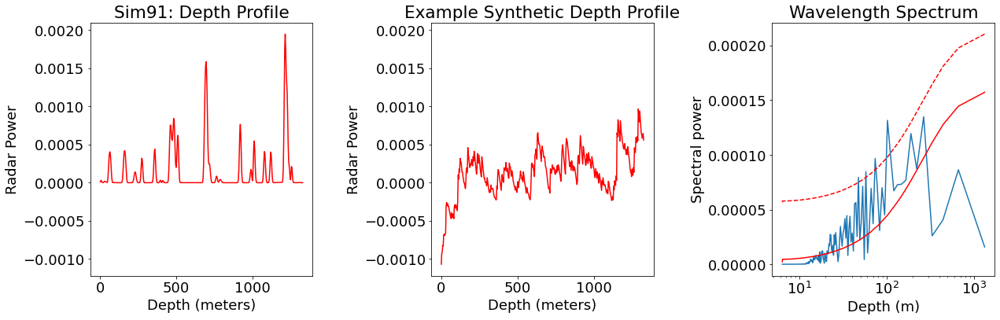

102.14989405545721 0.00013163326952637944
73.77492348449688 9.669414724687422e-05
57.73689664004103 8.4649089787275e-05
47.426736525748 7.947436649413827e-05


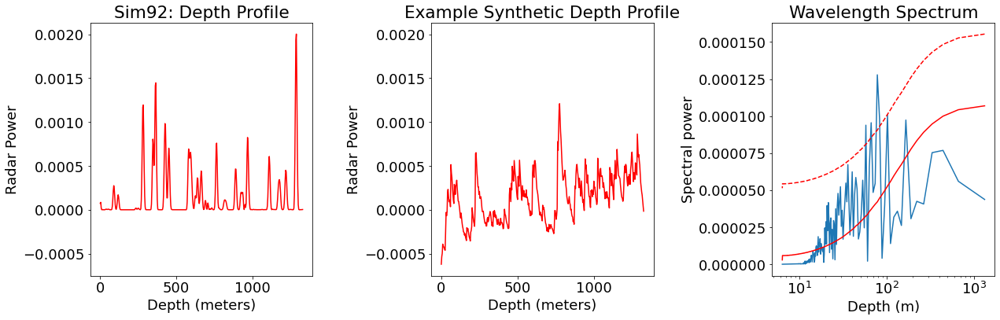

82.99678892005899 9.746094430191348e-05
78.11462486593787 0.00012790292196484732
66.39743113604719 9.555083810200391e-05
57.73689664004103 9.388495018915774e-05


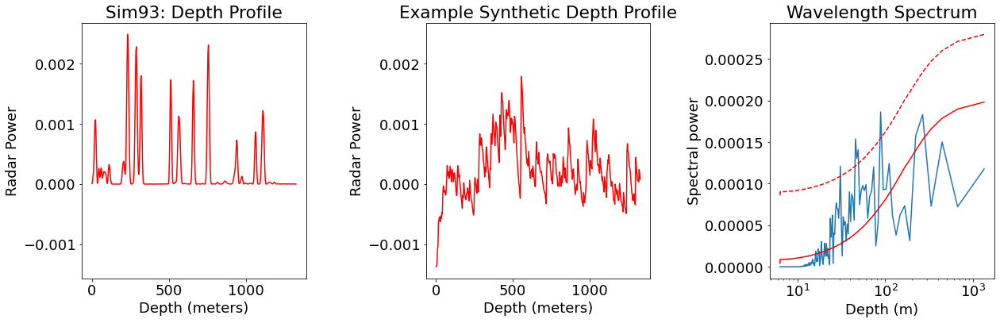

88.52990818139625 0.0001864135082311935
49.18328232299791 0.000140846390836923
47.426736525748 0.0001304175542321278
45.791331817963574 0.00015385732721969692
30.88252610978939 0.00012101249299632279


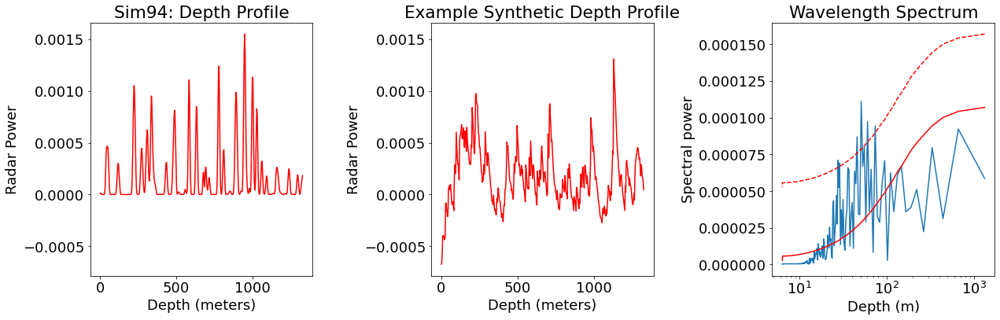

73.77492348449688 9.41468466246852e-05
60.36130103277018 9.716537683985443e-05
51.074947027728605 0.00011098231521416212
45.791331817963574 8.695826152830723e-05
28.868448320020516 6.9093466789843e-05
27.66559630668633 7.098542872461114e-05


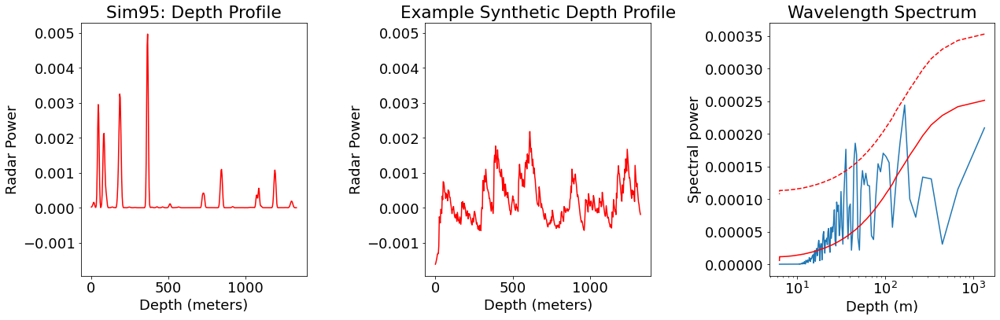

47.426736525748 0.0001680677350020522
45.791331817963574 0.00018576024858535717
44.264954090698126 0.00015718052753356586
35.89050331678227 0.00017642663708858876


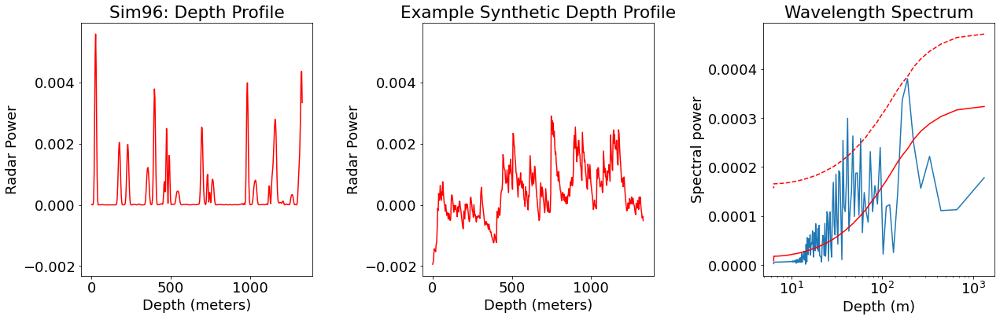

57.73689664004103 0.0002582842441776466
47.426736525748 0.000263447590213674
41.498394460029495 0.0002994473132534282
36.88746174224844 0.00025450391947783165


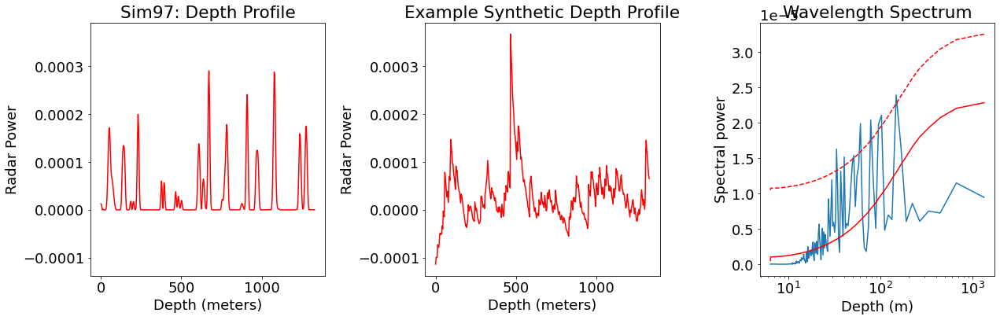

147.54984696899376 2.3942796500158986e-05
102.14989405545721 2.1093613016109482e-05
94.853473051496 1.9827958082494703e-05
78.11462486593787 2.0435715178291503e-05
60.36130103277018 1.9925881878207625e-05
51.074947027728605 1.540967141228966e-05
40.240867355180114 1.518544359505885e-05
33.198715568023594 1.6304577027738588e-05


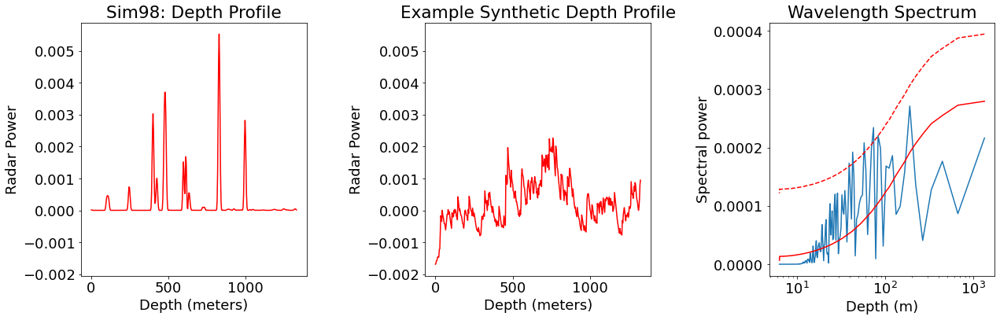

82.99678892005899 0.0002205195139785174
73.77492348449688 0.00023437419070979914
57.73689664004103 0.00020809602992054118
42.8370523458369 0.0001922302177432421
39.057312432968935 0.00017318110770888883


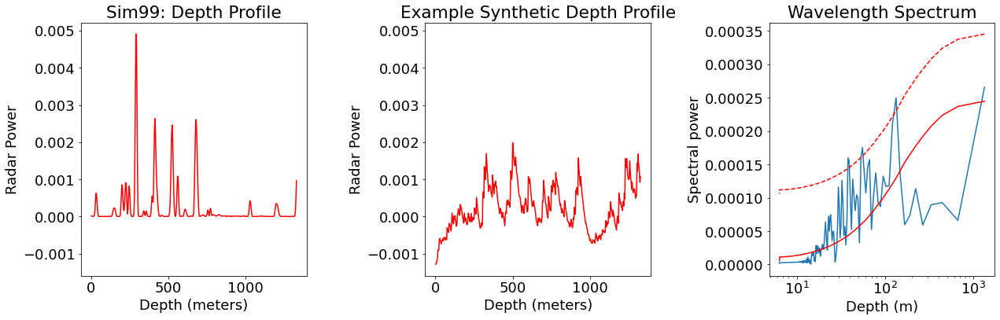

132.79486227209438 0.00024983288308034384
55.33119261337266 0.00017528921115178236
53.11794490883776 0.00016059150210739334
39.057312432968935 0.00015513248063230974
37.941389220598396 0.00015974544162437483


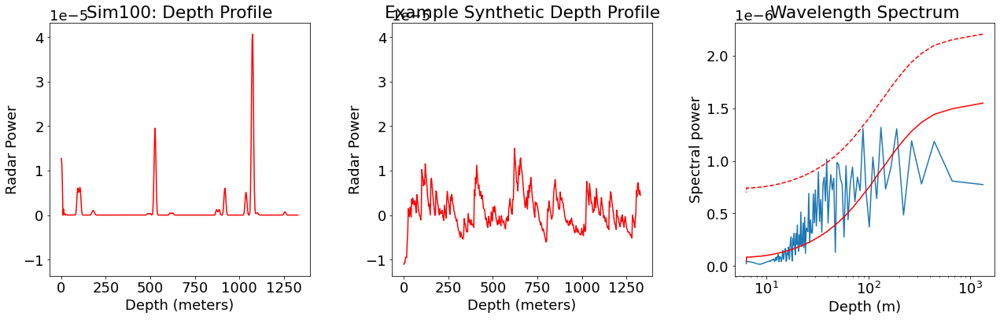

39.057312432968935 1.014264708900778e-06
Number of datasets: 100
Number of significant periodicities: 96
Simulations with significant periodicities:['87', '3', '4', '84', '32', '9', '90', '63', '76', '20', '45', '72', '12', '42', '73', '37', '49', '83', '65', '50', '52', '54', '13', '40', '35', '46', '27', '1', '18', '53', '48', '23', '70', '25', '99', '47', '22', '57', '60', '100', '98', '34', '68', '15', '39', '93', '58', '64', '21', '7', '77', '80', '56', '69', '41', '79', '94', '30', '61', '75', '91', '24', '89', '14', '67', '6', '55', '51', '85', '44', '8', '10', '19', '88', '38', '11', '66', '2', '29', '43', '78', '5', '97', '82', '31', '71', '36', '59', '86', '96', '62', '81', '92', '33', '74', '95']


In [5]:
#compute ffts, add red noise lines to each fft plot
sig_period_list = []

for i in column_names: 
    sample_strat = i
    #x = df["Depth_px"].to_list()
    #y = df[i].to_list()
    
    x = df_lin["Depth_px"].to_list()
    y = df_lin[i].to_list()
    
    
    peak = y.index(max(y[0:50])) #finds surface return
    surf = x[peak] #location of surface return
    
    #x = x[peak+5:]
    #y = y[peak+5:]
    
    x = x[peak+5:450] #remove weird end spike
    y = y[peak+5:450] # remove weird end spike
    
    if len(x) % 2 != 0:
        x.pop()
        y.pop()
        
    #convert pixels to meters
    x = p2m_waterice(x)
    
#     #compute line to fit synthetic data to
#     # Skewed Gaussian fit
#     model = SkewedGaussianModel()
#     params = model.make_params(amplitude=(max(y)), center=min(x)+20, sigma=20, gamma=1.5)
#     result = model.fit(y, params, x=x)
#     fit = result.best_fit +np.mean(y[-150:]) # prevents fit from damping out all of the noise on right-handed side

    #run fft 
    w, P1 = fft_radar(x,y)
    
    #Compute monte carlo red noise
    ft = [] #holds fourier transforms for each of 20000 random synthetic records
    syn = []

    for a in range(20000):
        #r=ar1(x,y,fit) #this creates a random synthetic record with similar properties
        r=ar1_nogauss(x,y) #gaussian doesn't seem to fit these synthetic spectra
        syn.append(r)
        w2, p = fft_radar(x,r)
        ft.append(p)
    
    plt.rcParams.update({'font.size': 18})
    #plot depth plot
    plt.figure(figsize = (18, 6))
    plt1 = plt.subplot(131)
    plt1.plot(x, y, 'r')
    #plt1.plot(x, fit, color = 'b') 
    plt1.set_title("Sim"+i+": Depth Profile")
    plt1.set_ylabel('Radar Power')
    plt1.set_xlabel('Depth (meters)')

    #plot example synthetic spectra
    plt2 = plt.subplot(132, sharey=plt1)
    plt2.plot(x, syn[0], 'r')
    #plt2.plot(x, fit, color = 'b')
    plt2.set_title('Example Synthetic Depth Profile')
    plt2.set_ylabel('Radar Power')
    plt2.set_xlabel('Depth (meters)')
    
#     print(np.mean(y))
#     print(np.mean(syn[0]))
#     print(np.var(y))
#     print(np.var(syn[0]))
    
    #plot spectrum
    plt3 = plt.subplot(133)
    plt3.plot(w, P1)
    plt3.plot(w,np.mean(ft, axis=0), 'r')
    plt3.plot(w,np.mean(ft, axis=0)+2*np.std(ft),'r',ls='dashed')
    plt3.set_title('Wavelength Spectrum')

    plt3.set_xscale('log')
    plt3.set_xlabel('Depth (m)')
    plt3.set_ylabel('Spectral power') #units are whatever JMARS reports, I have to look into this
    plt.tight_layout()
    plt.show()
    
    sig = np.mean(ft, axis=0)+2*np.std(ft)

    
    for j in range(len(P1)):
        if P1[j] > sig[j]:
            print(w[j], P1[j])
            sig_period_list.append(i)

sig_period_list = list(set(sig_period_list))

print("Number of datasets: " +str(len(column_names)))
print("Number of significant periodicities: " +str(len(sig_period_list)))
print("Simulations with significant periodicities:" +str(sig_period_list))
